In [1]:
from dask.distributed import LocalCluster, Client
cluster = LocalCluster(n_workers=4, threads_per_worker=1,  memory_limit='6GB')
client = Client(cluster)

In [2]:
from tropical_cyclones import TCs, multi_plot, plot_trajectories
from aqua.core.util import load_yaml

config = load_yaml('config_tcs_notebook.yaml')

/work/users/mccorda/miniforge3/envs/aqua-diagnostics/lib/python3.12/site-packages/intake_esm/__init__.py:6: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution


In [3]:
# initialise tropical class with streaming options
tropical = TCs(tdict=config, streaming=True,
                stream_step=config['stream']['streamstep'],
                stream_startdate=config['time']['startdate'],
                paths=config['paths'],
                loglevel=config['setup']['loglevel'],
                orography=True,
                nproc=1)

2025-12-19 14:55:20 :: TCs :: WARNING  -> Model ERA5 - Exp: era5
2025-12-19 14:55:20 :: TCs :: WARNING  -> Initialised streaming for 1D days starting on 1979-01-01 00:00:00


In [5]:
#v7
# ============================================================
#   STJ Filter (versione adattata ai dati 250 hPa)
#   Basato sul metodo di Bourdin et al. (2022)
#   Versione semplificata: climatologia mensile, soglie su U e V,
#   jet-lat trovato come massimo del profilo del wind speed.
#   FIX: gestisce sia spazi che virgole come separatori
# ============================================================
import csv
import xarray as xr
import numpy as np
import os


# ------------------------------------------------------------
# 1) Caricamento ERA5 a 250 hPa
# ------------------------------------------------------------
def load_era5_250(year, era5_dir):
    fu = f"{era5_dir}/ERA5_u_component_of_wind_250hPa_6hr_{year}.nc"
    fv = f"{era5_dir}/ERA5_v_component_of_wind_250hPa_6hr_{year}.nc"

    ds_u = xr.open_dataset(fu)
    ds_v = xr.open_dataset(fv)

    # uniforma il nome del tempo
    if "valid_time" in ds_u.coords:
        ds_u = ds_u.rename({"valid_time": "time"})
    if "valid_time" in ds_v.coords:
        ds_v = ds_v.rename({"valid_time": "time"})

    # converti longitudine in [-180, 180]
    if ds_u.longitude.max() > 180:
        new_lon = ((ds_u.longitude + 180) % 360) - 180
        ds_u = ds_u.assign_coords(longitude=new_lon)
        ds_v = ds_v.assign_coords(longitude=new_lon)

    # squeeze livello
    if "pressure_level" in ds_u.dims:
        ds_u = ds_u.squeeze("pressure_level")
    if "pressure_level" in ds_v.dims:
        ds_v = ds_v.squeeze("pressure_level")

    return ds_u, ds_v


# ------------------------------------------------------------
# 2) Climatologia mensile U e V + wind speed zonale
# ------------------------------------------------------------
def compute_monthly_climatology_250(years, era5_dir):
    # concateneremo via xarray direttamente
    u_list = []
    v_list = []

    for y in years:
        print(f"[DEBUG] Loading {y} ERA5 250 hPa...")
        ds_u, ds_v = load_era5_250(y, era5_dir)
        u_list.append(ds_u["u"])
        v_list.append(ds_v["v"])

    u_all = xr.concat(u_list, dim="time")
    v_all = xr.concat(v_list, dim="time")

    # climatologia mensile
    u_mon = u_all.groupby("time.month").mean("time")
    v_mon = v_all.groupby("time.month").mean("time")

    # wind speed
    V_mon = np.sqrt(u_mon**2 + v_mon**2)

    return u_mon, v_mon, V_mon


# ------------------------------------------------------------
# 3) Estrarre jet-lat (versione compatibile con Bourdin)
#    massimo del profilo zonale del wind speed
# ------------------------------------------------------------
def compute_jet_latitudes(u_mon, V_mon,
                          lat_min=10, lat_max=50,
                          u_thresh=15, V_thresh=25):
    lat = u_mon.latitude.values
    jet_lat_N = np.full(12, np.nan)
    jet_lat_S = np.full(12, np.nan)

    for m in range(12):
        u_prof  = u_mon.isel(month=m).mean(dim="longitude").values
        V_prof  = V_mon.isel(month=m).mean(dim="longitude").values

        # maschera soglia (simplification of Bourdin)
        mask = (u_prof >= u_thresh) & (V_prof >= V_thresh)

        # NH
        idxN = np.where((lat >= lat_min) & (lat <= lat_max))[0]
        validN = idxN[mask[idxN]] if len(idxN) > 0 else []

        if len(validN) > 0:
            jet_lat_N[m] = lat[validN].max()

        # SH
        idxS = np.where((lat <= -lat_min) & (lat >= -lat_max))[0]
        validS = idxS[mask[idxS]] if len(idxS) > 0 else []

        if len(validS) > 0:
            jet_lat_S[m] = lat[validS].min()

    return jet_lat_N, jet_lat_S


# ------------------------------------------------------------
# 4) Funzione helper per parsare una riga (spazi o virgole)
# ------------------------------------------------------------
def parse_track_line(line):
    """
    Prova a parsare una riga che può essere separata da spazi o virgole.
    Ritorna None se la riga non è valida.
    """
    line = line.strip()
    if not line or line.startswith("#"):
        return None
    
    # Prova prima con virgole
    if ',' in line:
        parts = [p.strip() for p in line.split(',')]
    else:
        parts = line.split()
    
    # Rimuovi virgole trailing dai valori
    parts = [p.rstrip(',') for p in parts]
    
    return parts if len(parts) >= 11 else None


# ------------------------------------------------------------
# 5) Filtro STJ su un file di tracce (FIXED VERSION)
# ------------------------------------------------------------
def filter_STJ_Bourdin250_monthly(trajfile, era5_dir,
                                  buffer_deg=8.0,  # Aumentato da 4 a 8 gradi
                                  lat_min=10, lat_max=50):
    print(f"[INFO] STJ filter (Bourdin 250 hPa monthly) applied to {trajfile}")

    # ---- determina gli anni nel file delle tracce ---
    years = set()
    with open(trajfile, "r") as f:
        for line_num, line in enumerate(f):
            # Skippa header (prima riga)
            if line_num == 0:
                continue
            
            parts = parse_track_line(line)
            if parts is None:
                continue
            try:
                # L'anno è nella colonna 1 (0-indexed)
                year = int(parts[1])
                # Converti anno a 2 cifre in 4 cifre (assume 1900-2099)
                if year < 100:
                    year = 1900 + year if year >= 50 else 2000 + year
                years.add(year)
            except (ValueError, IndexError):
                continue
    
    years = sorted(list(years))
    print(f"[INFO] Climatology years: {years[0]}–{years[-1]}")

    # ---- climatologia ----
    u_mon, v_mon, V_mon = compute_monthly_climatology_250(years, era5_dir)

    # ---- jet lat ----
    jet_lat_N, jet_lat_S = compute_jet_latitudes(u_mon, V_mon,
                                                 lat_min=lat_min,
                                                 lat_max=lat_max,
                                                 u_thresh=25,
                                                 V_thresh=25)

    print("[INFO] Jet latitudes NH:", np.round(jet_lat_N, 2))
    print("[INFO] Jet latitudes SH:", np.round(jet_lat_S, 2))

    # ---- output file ----
    out_file = trajfile.replace(".txt", "_filtered_STJ_Bourdin250_monthly.txt")
    out_file = out_file.replace(".csv", "_filtered_STJ_Bourdin250_monthly.txt")
    fout = open(out_file, "w")

    keep_lines = []
    tropical_counter = 0

    def flush_track():
        nonlocal tropical_counter, keep_lines
        # RIDOTTO A 1: basta un solo timestep tropicale
        if tropical_counter >= 1:
            for L in keep_lines:
                fout.write(L)
        tropical_counter = 0
        keep_lines = []

    # ---- parsing file ----
    current_storm = None
    with open(trajfile, "r") as fin:
        for line_num, line in enumerate(fin):
            # Skippa header (prima riga)
            if line_num == 0:
                continue
                
            parts = parse_track_line(line)
            if parts is None:
                continue

            try:
                storm_id = parts[0]
                year  = int(parts[1])
                # Converti anno a 2 cifre in 4 cifre
                if year < 100:
                    year = 1900 + year if year >= 50 else 2000 + year
                month = int(parts[2])
                lat   = float(parts[8])
                
                # Controlla se è un nuovo storm
                if storm_id != current_storm:
                    flush_track()
                    current_storm = storm_id
                
                mi = month - 1

                # classificazione tropicale
                if lat >= 0:     # emisfero nord
                    jet = jet_lat_N[mi]
                    is_trop = (np.isnan(jet) or lat <= jet - buffer_deg)
                else:
                    jet = jet_lat_S[mi]
                    is_trop = (np.isnan(jet) or lat >= jet + buffer_deg)

                if is_trop:
                    tropical_counter += 1

                keep_lines.append(line)
                
            except (ValueError, IndexError) as e:
                print(f"[WARNING] Skipping malformed line: {line.strip()[:50]}...")
                continue

        flush_track()

    fout.close()
    print(f"[INFO] Filter complete. Output:", out_file)
    return out_file, jet_lat_N, jet_lat_S

In [6]:
# ===========================================
# 1. SETUP - Parametri da config
# ===========================================
import os
from glob import glob
from datetime import datetime

trackdir = config['paths']['trackdir']
tmpdir = config['paths']['tmpdir']
era5_dir = "/work/users/mccorda/data"
start_date = datetime.strptime(config['time']['startdate'], "%Y%m%d")
end_date   = datetime.strptime(config['time']['enddate'], "%Y%m%d")

In [7]:
# ===========================================
# 2. SELEZIONE FILE - Trova i file tempest_track nel range di date
# ===========================================
all_files = sorted(glob(os.path.join(trackdir, "tempest_track_*.txt")))
filenames = []
for f in all_files:
    base = os.path.basename(f)
    try:
        parts = base.replace("tempest_track_", "").replace(".txt", "").split("-")
        start_f = datetime.strptime(parts[0], "%Y%m%d")
        end_f = datetime.strptime(parts[1], "%Y%m%d")
        if end_f >= start_date and start_f <= end_date:
            filenames.append(f)
    except:
        pass

print(f"[INFO] File selezionati: {len(filenames)}")

[INFO] File selezionati: 783


In [8]:
# ===========================================
# 3. MERGE FILE - CON STORM_ID UNICI
# ===========================================
os.makedirs(tmpdir, exist_ok=True)
tot_file = os.path.join(tmpdir, f"tempest_tracks_tot_{config['time']['startdate']}_{config['time']['enddate']}.txt")

global_storm_id = 0  # Contatore globale

with open(tot_file, 'w') as output_file:
    output_file.write("track_id year month day hour i j lon lat slp wind zs\n")
    
    for fname in filenames:
        with open(fname, 'r') as infile:
            lines = infile.readlines()
            
            if len(lines) == 0:
                print(f"[WARNING] File vuoto: {fname}")
                continue
            
            # Mappa storm_id locali -> storm_id globali
            local_to_global = {}
            
            for line in lines[1:]:  # Skippa header
                clean = line.replace(',', '').strip()
                if not clean:
                    continue
                parts = clean.split()
                if len(parts) != 12:
                    continue
                
                local_id = parts[0]
                
                # Assegna nuovo ID globale se è la prima volta che vediamo questo local_id
                if local_id not in local_to_global:
                    local_to_global[local_id] = str(global_storm_id)
                    global_storm_id += 1
                
                # Sostituisci con ID globale
                parts[0] = local_to_global[local_id]
                output_file.write(" ".join(parts) + "\n")

print(f"[INFO] File totale creato: {tot_file}")
print(f"[INFO] Totale storm unici: {global_storm_id}")

[WARNING] File vuoto: /work/users/mccorda/tc_analysis/trackdir/ERA5/era5/tempest_track_19840430-19840529.txt
[WARNING] File vuoto: /work/users/mccorda/tc_analysis/trackdir/ERA5/era5/tempest_track_19880430-19880529.txt
[WARNING] File vuoto: /work/users/mccorda/tc_analysis/trackdir/ERA5/era5/tempest_track_20050501-20050530.txt
[INFO] File totale creato: /work/users/mccorda/tc_analysis/tmpdir/ERA5/era5/tempest_tracks_tot_19790101_20150106.txt
[INFO] Totale storm unici: 2373


In [9]:
# ===========================================
# 4. FILTRO STJ - Applica il filtro 
# ===========================================
result = filter_STJ_Bourdin250_monthly(tot_file, era5_dir=era5_dir)
filtered_file = result[0] if isinstance(result, tuple) else result
print(f"[INFO] File filtrato: {filtered_file}")

[INFO] STJ filter (Bourdin 250 hPa monthly) applied to /work/users/mccorda/tc_analysis/tmpdir/ERA5/era5/tempest_tracks_tot_19790101_20150106.txt
[INFO] Climatology years: 1979–2014
[DEBUG] Loading 1979 ERA5 250 hPa...
[DEBUG] Loading 1980 ERA5 250 hPa...
[DEBUG] Loading 1981 ERA5 250 hPa...
[DEBUG] Loading 1982 ERA5 250 hPa...
[DEBUG] Loading 1983 ERA5 250 hPa...
[DEBUG] Loading 1984 ERA5 250 hPa...
[DEBUG] Loading 1986 ERA5 250 hPa...
[DEBUG] Loading 1987 ERA5 250 hPa...
[DEBUG] Loading 1988 ERA5 250 hPa...
[DEBUG] Loading 1989 ERA5 250 hPa...
[DEBUG] Loading 1990 ERA5 250 hPa...
[DEBUG] Loading 1991 ERA5 250 hPa...
[DEBUG] Loading 1992 ERA5 250 hPa...
[DEBUG] Loading 1993 ERA5 250 hPa...
[DEBUG] Loading 1994 ERA5 250 hPa...
[DEBUG] Loading 1995 ERA5 250 hPa...
[DEBUG] Loading 1996 ERA5 250 hPa...
[DEBUG] Loading 1997 ERA5 250 hPa...
[DEBUG] Loading 1998 ERA5 250 hPa...
[DEBUG] Loading 1999 ERA5 250 hPa...
[DEBUG] Loading 2000 ERA5 250 hPa...
[DEBUG] Loading 2001 ERA5 250 hPa...
[DEBU

In [ ]:
# test plotting_TCs_custom.py
# ===========================================
# IMPORT FUNZIONE DA FILE CUSTOM
# ===========================================
import sys
import os

# Aggiungi il percorso dove hai salvato plotting_TCs_custom.py
# Modifica questo path in base a dove hai salvato il file
custom_path = '/home/mccorda/work/AQUA-diagnostics/frontier-diagnostics/tropical_cyclones/tropical_cyclones/plots/'
if custom_path not in sys.path:
    sys.path.insert(0, custom_path)

# Ora importa
from plotting_TCs_custom import plot_trajectories_direct, plot_trajectories_colored

# Plot standard (tutti i timestep)
plot_trajectories_direct(filtered_file, config)

Plotting trajectories from: /work/users/mccorda/tc_analysis/tmpdir/ERA5/era5/tempest_tracks_tot_19790101_20150106_filtered_STJ_Bourdin250_monthly.txt
Reading trajectories directly from: /work/users/mccorda/tc_analysis/tmpdir/ERA5/era5/tempest_tracks_tot_19790101_20150106_filtered_STJ_Bourdin250_monthly.txt
Found 2349 trajectories
Maximum number of points per trajectory: 84


In [ ]:
# test plotting_TCs_custom.py coloured
custom_path = '/home/mccorda/work/AQUA-diagnostics/frontier-diagnostics/tropical_cyclones/tropical_cyclones/plots/'
if custom_path not in sys.path:
    sys.path.insert(0, custom_path)
    
from plotting_TCs_custom import plot_trajectories_direct, plot_trajectories_colored

# Funzione plot a colori
plot_trajectories_colored(filtered_file, config, color_by='category')

In [9]:
# ===========================================
# 5. CONVERSIONE FORMATO - CON LIMITE 10 TIMESTEPS
# ===========================================
#input_file = tot_file  # Cambierai in filtered_file dopo
input_file = filtered_file
tempest_file = input_file.replace('.txt', '_tempest.txt')

storms = {}
with open(input_file, 'r') as fin:
    next(fin)  # Skippa header
    for line in fin:
        parts = line.strip().split()
        if len(parts) != 12:
            continue
        
        storm_id = parts[0]
        if storm_id not in storms:
            storms[storm_id] = []
        
        # ORDINE CORRETTO per plot
        reordered = [
            parts[1],   # year
            parts[2],   # month  
            parts[7],   # lon (pos 2)
            parts[8],   # lat (pos 3)
            parts[9],   # slp
            parts[10],  # wind
            parts[3],   # day
            parts[4],   # hour
            parts[5],   # i
            parts[6]    # j
        ]
        storms[storm_id].append(reordered)

print(f"[INFO] Trovate {len(storms)} tracce")

# IMPORTANTE: Limite a 10 timestep (hardcoded in getTrajectories)
MAX_TIMESTEPS = 10

with open(tempest_file, 'w') as fout:
    for storm_id, timesteps in storms.items():
        N = min(len(timesteps), MAX_TIMESTEPS)
        if N == 0:
            continue
        
        fout.write(f"start {N}\n")
        for ts in timesteps[:N]:
            fout.write(" ".join(ts) + "\n")
        fout.write("\n")

print(f"[INFO] File creato: {tempest_file} (max {MAX_TIMESTEPS} timestep per traccia)")

[INFO] Trovate 2349 tracce
[INFO] File creato: /work/users/mccorda/tc_analysis/tmpdir/ERA5/era5/tempest_tracks_tot_19790101_20150106_filtered_STJ_Bourdin250_monthly_tempest.txt (max 10 timestep per traccia)


File test con 20 timestep: /work/users/mccorda/tc_analysis/tmpdir/ERA5/era5/tempest_tracks_tot_19790101_20150106_filtered_STJ_Bourdin250_monthly_tempest_test10t.txt
Storm nel file: 2349
Getting trajectories from TempestExtremes file...
Running getTrajectories on '/work/users/mccorda/tc_analysis/tmpdir/ERA5/era5/tempest_tracks_tot_19790101_20150106_filtered_STJ_Bourdin250_monthly_tempest_test10t.txt' with unstruc set to '0'
nVars set to 10 and headerDelimStr set to 'start'
header DelimStr start
start 10

1979 1 144.000000 -14.500000 9.911223e+04 1.621687e+01 1 6 144 75

1979 1 145.000000 -14.500000 9.945883e+04 1.689734e+01 1 12 145 75

1979 1 146.000000 -15.500000 9.917905e+04 1.582430e+01 1 18 146 74

1979 1 146.000000 -15.500000 9.936432e+04 1.567251e+01 2 0 146 74

1979 1 146.000000 -15.500000 9.915741e+04 1.426620e+01 2 6 146 74

1979 1 146.000000 -15.500000 9.944913e+04 1.513953e+01 2 12 146 74

1979 1 146.000000 -15.500000 9.933048e+04 1.371930e+01 2 18 146 74

1979 1 146.000000 

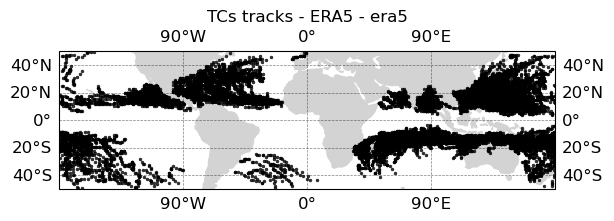

✓ FUNZIONA con 10 timestep!


In [10]:
# ===========================================
# PLOT . TEST FINALE - Riduci a 10 timestep (come il test che funzionava)
# ===========================================
test_file = tempest_file.replace('.txt', '_test10t.txt')

with open(tempest_file, 'r') as fin, open(test_file, 'w') as fout:
    in_storm = False
    line_count = 0
    
    for line in fin:
        if line.startswith("start"):
            fout.write("start 10\n")  # Forza 20 timestep
            in_storm = True
            line_count = 0
            continue
        
        if in_storm:
            line_count += 1
            if line_count <= 10:
                fout.write(line)

print(f"File test con 20 timestep: {test_file}")

# Verifica
with open(test_file, 'r') as f:
    lines = f.readlines()
    n_storms = sum(1 for line in lines if line.startswith("start"))
    print(f"Storm nel file: {n_storms}")


#plot_trajectories(tempest_file, config)
# Prova il plot
try:
    plot_trajectories(test_file, config)
    
    print("✓ FUNZIONA con 10 timestep!")
except Exception as e:
    print(f"❌ Fallisce anche con 10 timestep: {e}")
    
    # Se fallisce anche con 10, il problema è nel formato delle righe
    # Verifica una riga nel dettaglio
    print("\nDEBUG riga:")
    with open(test_file, 'r') as f:
        for line in f:
            if not line.startswith("start") and line.strip():
                parts = line.strip().split()
                print(f"Parti: {len(parts)}")
                for i, p in enumerate(parts):
                    print(f"  [{i}] = {p}")
                break

In [14]:
# ===========================================
# 7. VERIFICA - Controlla se il plot è stato salvato
# ===========================================
import os

plotdir = config['paths']['plotdir']
model = config['dataset']['model']
exp = config['dataset']['exp']

expected_file = f"tracks_{model}_{exp}.pdf"
expected_path = os.path.join(plotdir, expected_file)

print(f"Cerco il plot in: {expected_path}")

if os.path.exists(expected_path):
    print(f"✓✓✓ PLOT TROVATO!")
    print(f"    Percorso: {expected_path}")
    
    # Mostra info sul file
    import time
    file_time = os.path.getmtime(expected_path)
    file_size = os.path.getsize(expected_path)
    print(f"    Dimensione: {file_size} bytes")
    print(f"    Ultima modifica: {time.ctime(file_time)}")
else:
    print(f"❌ Plot NON trovato")
    print(f"    Contenuto di {plotdir}:")
    if os.path.exists(plotdir):
        for f in os.listdir(plotdir):
            print(f"      - {f}")
    else:
        print(f"      Directory non esiste!")

Cerco il plot in: /work/users/mccorda/tc_analysis/Figures/tracks_ERA5_era5.pdf
✓✓✓ PLOT TROVATO!
    Percorso: /work/users/mccorda/tc_analysis/Figures/tracks_ERA5_era5.pdf
    Dimensione: 922754 bytes
    Ultima modifica: Thu Dec 18 14:23:29 2025


Numero totale di cicloni filtrati: 2349


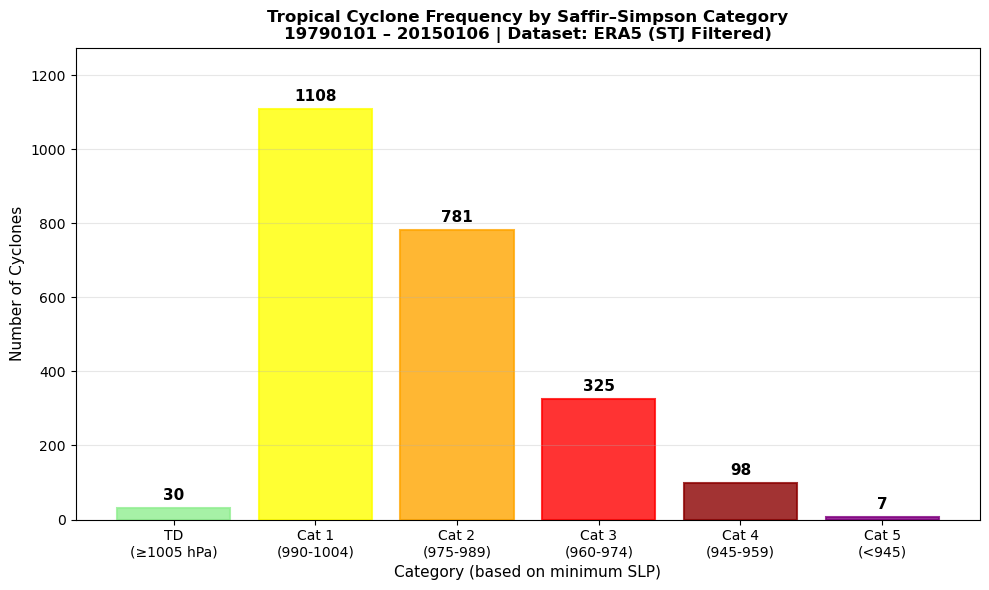


Distribuzione per categoria:
  Cat 0:   30 cicloni (  1.3%)
  Cat 1: 1108 cicloni ( 47.2%)
  Cat 2:  781 cicloni ( 33.2%)
  Cat 3:  325 cicloni ( 13.8%)
  Cat 4:   98 cicloni (  4.2%)
  Cat 5:    7 cicloni (  0.3%)

Totale: 2349 cicloni


In [14]:
# ===========================================
# ISTOGRAMMA TCs PER CATEGORIA SAFFIR-SIMPSON (CORRETTO)
# ===========================================
import numpy as np
import matplotlib.pyplot as plt

# Funzione di categorizzazione Saffir–Simpson basata su SLP
def category_from_slp_pa(slp_pa):
    slp_hpa = slp_pa / 100.0
    if slp_hpa >= 1005:
        return 0
    elif slp_hpa >= 990:
        return 1
    elif slp_hpa >= 975:
        return 2
    elif slp_hpa >= 960:
        return 3
    elif slp_hpa >= 945:
        return 4
    else:
        return 5

# Leggi il file filtrato (SENZA skippare header perché non ce n'è)
storm_min_slp = {}

with open(filtered_file, 'r') as f:
    for line in f:
        parts = line.strip().split()
        if len(parts) != 12:
            continue
        
        storm_id = parts[0]
        slp_pa = float(parts[9])  # Colonna 9 = SLP in Pa
        
        # Traccia SLP minima per ogni storm
        if storm_id not in storm_min_slp:
            storm_min_slp[storm_id] = slp_pa
        else:
            storm_min_slp[storm_id] = min(storm_min_slp[storm_id], slp_pa)

print(f"Numero totale di cicloni filtrati: {len(storm_min_slp)}")

# Converti in categorie
categories = [category_from_slp_pa(slp) for slp in storm_min_slp.values()]

# Conta per categoria
counts = np.bincount(categories, minlength=6)

# Plot
plt.figure(figsize=(10, 6))
bars = plt.bar(range(6), counts, edgecolor='k', linewidth=1.5, alpha=0.8)

# Colora in base a categoria
colors = ['lightgreen', 'yellow', 'orange', 'red', 'darkred', 'purple']
for i, bar in enumerate(bars):
    bar.set_color(colors[i])

plt.xticks(range(6), ['TD\n(≥1005 hPa)', 'Cat 1\n(990-1004)', 'Cat 2\n(975-989)', 
                       'Cat 3\n(960-974)', 'Cat 4\n(945-959)', 'Cat 5\n(<945)'],
           fontsize=10)
plt.title(f"Tropical Cyclone Frequency by Saffir–Simpson Category\n"
          f"{config['time']['startdate']} – {config['time']['enddate']} | "
          f"Dataset: {config['dataset']['model']} (STJ Filtered)",
          fontsize=12, fontweight='bold')
plt.xlabel("Category (based on minimum SLP)", fontsize=11)
plt.ylabel("Number of Cyclones", fontsize=11)
plt.ylim(0, max(counts)*1.15 if max(counts) > 0 else 10)
plt.grid(alpha=0.3, axis='y')

# Aggiungi numeri sopra le barre
for i, count in enumerate(counts):
    plt.text(i, count + max(counts)*0.02, str(count), 
             ha='center', fontweight='bold', fontsize=11)

plt.tight_layout()

# Salva con date nel nome
startdate = config['time']['startdate']
enddate = config['time']['enddate']
plotdir = config['paths']['plotdir']

os.makedirs(plotdir, exist_ok=True)
plt.savefig(os.path.join(plotdir, 
            f"tc_categories_{config['dataset']['model']}_{config['dataset']['exp']}_{startdate}_{enddate}.pdf"), 
            dpi=300, bbox_inches='tight')
plt.show()

print(f"\nDistribuzione per categoria:")
for i, count in enumerate(counts):
    pct = count/len(storm_min_slp)*100 if len(storm_min_slp) > 0 else 0
    print(f"  Cat {i}: {count:4d} cicloni ({pct:5.1f}%)")
print(f"\nTotale: {len(storm_min_slp)} cicloni")

Cicloni non filtrati: 2373
Cicloni filtrati STJ: 2349
Percentuale mantenuta: 99.0%


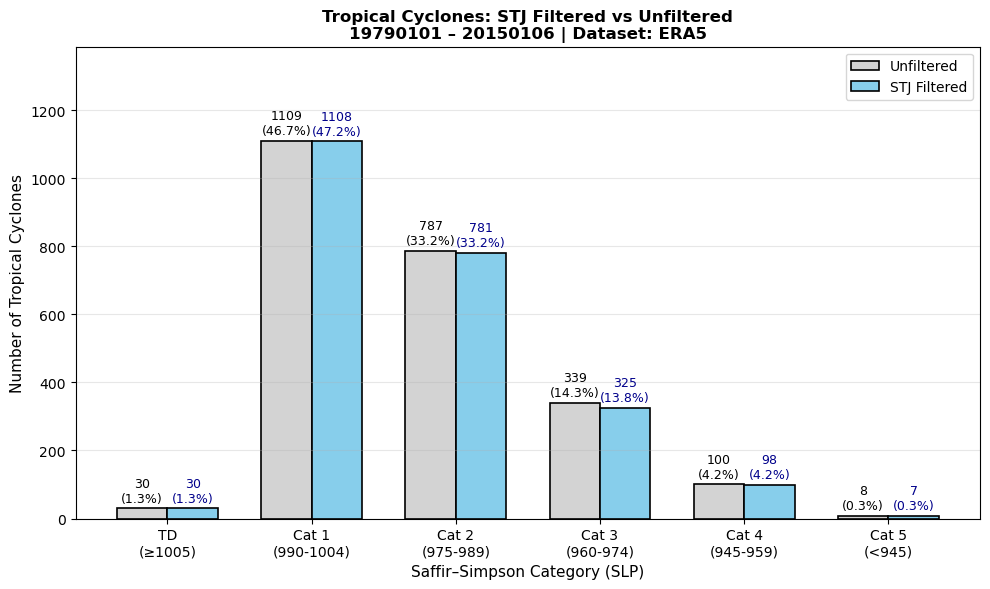


STATISTICHE CONFRONTO
Categoria    Unfiltered   Filtered     % Kept    
--------------------------------------------------
Cat 0        30           30            100.0%
Cat 1        1109         1108           99.9%
Cat 2        787          781            99.2%
Cat 3        339          325            95.9%
Cat 4        100          98             98.0%
Cat 5        8            7              87.5%
--------------------------------------------------
TOTALE       2373         2349           99.0%


In [12]:
# ===========================================
# CONFRONTO FILTRATI VS NON FILTRATI 
# ===========================================
import matplotlib.pyplot as plt
import numpy as np

# Funzione per leggere file CSV normale (non TempestExtremes)
def load_tracks_from_csv(file_path):
    """Legge file formato: track_id year month day hour i j lon lat slp wind zs"""
    storm_min_slp = {}
    
    with open(file_path, 'r') as f:
        for line in f:
            # Skippa header se presente
            if 'track_id' in line or 'year' in line:
                continue
            
            parts = line.strip().split()
            if len(parts) != 12:
                continue
            
            storm_id = parts[0]
            slp_pa = float(parts[9])  # Colonna 9 = SLP in Pa
            
            if storm_id not in storm_min_slp:
                storm_min_slp[storm_id] = slp_pa
            else:
                storm_min_slp[storm_id] = min(storm_min_slp[storm_id], slp_pa)
    
    return storm_min_slp

# ------------------------------
# Calcola categorie per i cicloni NON filtrati
# ------------------------------
storm_slp_all = load_tracks_from_csv(tot_file)
categories_all = [category_from_slp_pa(slp) for slp in storm_slp_all.values()]

print(f"Cicloni non filtrati: {len(storm_slp_all)}")

# ------------------------------
# Calcola categorie per i cicloni FILTRATI
# ------------------------------
storm_slp_filt = load_tracks_from_csv(filtered_file)
categories_filt = [category_from_slp_pa(slp) for slp in storm_slp_filt.values()]

print(f"Cicloni filtrati STJ: {len(storm_slp_filt)}")
print(f"Percentuale mantenuta: {len(storm_slp_filt)/len(storm_slp_all)*100:.1f}%")

# ------------------------------
# Plot confronto
# ------------------------------
bins = np.arange(-0.5, 6.5, 1)
xticks = range(6)
counts_all = np.bincount(categories_all, minlength=6)
counts_filt = np.bincount(categories_filt, minlength=6)

fig, ax = plt.subplots(figsize=(10, 6))

# Barre affiancate
x = np.arange(6)
width = 0.35

bars1 = ax.bar(x - width/2, counts_all, width, label='Unfiltered', 
               color='lightgrey', edgecolor='k', linewidth=1.2)
bars2 = ax.bar(x + width/2, counts_filt, width, label='STJ Filtered', 
               color='skyblue', edgecolor='k', linewidth=1.2)

ax.set_xticks(xticks)
ax.set_xticklabels(['TD\n(≥1005)', 'Cat 1\n(990-1004)', 'Cat 2\n(975-989)', 
                    'Cat 3\n(960-974)', 'Cat 4\n(945-959)', 'Cat 5\n(<945)'])
ax.set_xlabel("Saffir–Simpson Category (SLP)", fontsize=11)
ax.set_ylabel("Number of Tropical Cyclones", fontsize=11)
ax.set_title(f"Tropical Cyclones: STJ Filtered vs Unfiltered\n"
             f"{config['time']['startdate']} – {config['time']['enddate']} | "
             f"Dataset: {config['dataset']['model']}", 
             fontsize=12, fontweight='bold')
ax.legend(fontsize=10)
ax.grid(alpha=0.3, axis='y')

# Alza il limite dell'asse y
max_height = max(max(counts_all), max(counts_filt))
ax.set_ylim(0, max_height * 1.25)

# Aggiungi numeri e percentuali sopra le barre
for i, (c_all, c_filt) in enumerate(zip(counts_all, counts_filt)):
    pct_all = c_all / counts_all.sum() * 100 if counts_all.sum() > 0 else 0
    pct_filt = c_filt / counts_filt.sum() * 100 if counts_filt.sum() > 0 else 0
    
    # Unfiltered (sinistra)
    ax.text(i - width/2, c_all + max_height*0.01, 
            f"{c_all}\n({pct_all:.1f}%)", 
            ha='center', va='bottom', fontsize=9, color='black')
    
    # Filtered (destra)
    ax.text(i + width/2, c_filt + max_height*0.01, 
            f"{c_filt}\n({pct_filt:.1f}%)", 
            ha='center', va='bottom', fontsize=9, color='darkblue')

plt.tight_layout()

# Salva con date nel nome
startdate = config['time']['startdate']
enddate = config['time']['enddate']
plotdir = config['paths']['plotdir']

plt.tight_layout()
plt.savefig(os.path.join(plotdir, 
            f"tc_comparison_{config['dataset']['model']}_{config['dataset']['exp']}_{startdate}_{enddate}.pdf"), 
            dpi=300, bbox_inches='tight')
plt.show()

# Stampa statistiche
print("\n" + "="*50)
print("STATISTICHE CONFRONTO")
print("="*50)
print(f"{'Categoria':<12} {'Unfiltered':<12} {'Filtered':<12} {'% Kept':<10}")
print("-"*50)
for i in range(6):
    pct_kept = counts_filt[i]/counts_all[i]*100 if counts_all[i] > 0 else 0
    print(f"Cat {i:<8} {counts_all[i]:<12} {counts_filt[i]:<12} {pct_kept:>6.1f}%")
print("-"*50)
print(f"{'TOTALE':<12} {counts_all.sum():<12} {counts_filt.sum():<12} "
      f"{counts_filt.sum()/counts_all.sum()*100:>6.1f}%")

Numero cicloni: 2349
SLP range: 926.9 - 1015.5 hPa
SLP medio: 986.7 hPa


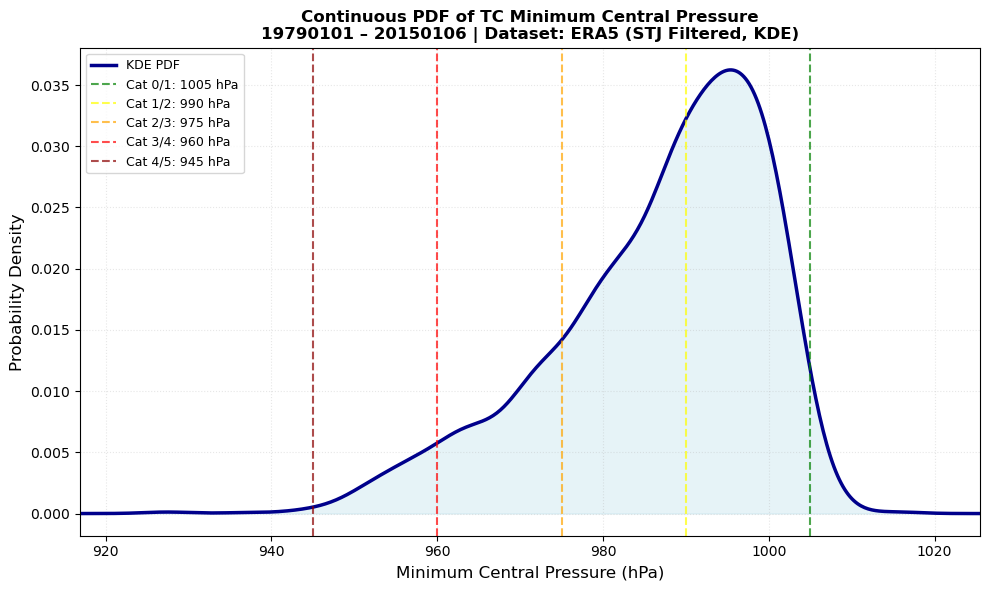


Statistiche SLP (hPa):
  Media: 986.7
  Mediana: 989.6
  Std dev: 12.9
  Min: 926.9
  Max: 1015.5


In [17]:
# ===========================================
# PDF CONTINUA DELLA PRESSIONE MINIMA (KDE)
# ===========================================
from scipy.stats import gaussian_kde
import numpy as np
import matplotlib.pyplot as plt

# Carica SLP minimi dai cicloni filtrati
storm_slp_filt = {}
with open(filtered_file, 'r') as f:
    for line in f:
        if 'track_id' in line or 'year' in line:
            continue
        
        parts = line.strip().split()
        if len(parts) != 12:
            continue
        
        storm_id = parts[0]
        slp_pa = float(parts[9])
        
        if storm_id not in storm_slp_filt:
            storm_slp_filt[storm_id] = slp_pa
        else:
            storm_slp_filt[storm_id] = min(storm_slp_filt[storm_id], slp_pa)

# Converti a hPa
slp_hpa_filt = np.array([slp/100.0 for slp in storm_slp_filt.values()])

print(f"Numero cicloni: {len(slp_hpa_filt)}")
print(f"SLP range: {slp_hpa_filt.min():.1f} - {slp_hpa_filt.max():.1f} hPa")
print(f"SLP medio: {slp_hpa_filt.mean():.1f} hPa")

# Kernel Density Estimation
kde = gaussian_kde(slp_hpa_filt)
x = np.linspace(slp_hpa_filt.min() - 10, slp_hpa_filt.max() + 10, 500)
pdf_continuous = kde(x)

# Plot PDF continua
plt.figure(figsize=(10, 6))
plt.plot(x, pdf_continuous, linewidth=2.5, color='darkblue', label='KDE PDF')
plt.fill_between(x, pdf_continuous, alpha=0.3, color='lightblue')

# Aggiungi linee verticali per le soglie di categoria
category_thresholds = [1005, 990, 975, 960, 945]
colors_cat = ['green', 'yellow', 'orange', 'red', 'darkred']
for i, thresh in enumerate(category_thresholds):
    plt.axvline(thresh, color=colors_cat[i], linestyle='--', 
                linewidth=1.5, alpha=0.7, label=f'Cat {i}/{i+1}: {thresh} hPa')

plt.xlabel("Minimum Central Pressure (hPa)", fontsize=12)
plt.ylabel("Probability Density", fontsize=12)
plt.title(f"Continuous PDF of TC Minimum Central Pressure\n"
          f"{config['time']['startdate']} – {config['time']['enddate']} | "
          f"Dataset: {config['dataset']['model']} (STJ Filtered, KDE)",
          fontsize=12, fontweight='bold')
plt.grid(alpha=0.3, linestyle=':', linewidth=0.8)
plt.legend(fontsize=9, loc='upper left')
plt.xlim(slp_hpa_filt.min() - 10, slp_hpa_filt.max() + 10)

plt.tight_layout()

# Salva con date
startdate = config['time']['startdate']
enddate = config['time']['enddate']
plotdir = config['paths']['plotdir']

os.makedirs(plotdir, exist_ok=True)
plt.savefig(os.path.join(plotdir, 
            f"tc_pdf_continuous_{config['dataset']['model']}_{config['dataset']['exp']}_{startdate}_{enddate}.pdf"), 
            dpi=300, bbox_inches='tight')
plt.show()

# Statistiche aggiuntive
print(f"\nStatistiche SLP (hPa):")
print(f"  Media: {slp_hpa_filt.mean():.1f}")
print(f"  Mediana: {np.median(slp_hpa_filt):.1f}")
print(f"  Std dev: {slp_hpa_filt.std():.1f}")
print(f"  Min: {slp_hpa_filt.min():.1f}")
print(f"  Max: {slp_hpa_filt.max():.1f}")

Totale punti: 54515
Range lon: 0.0 - 359.0
Range lat: -67.5 - 66.5


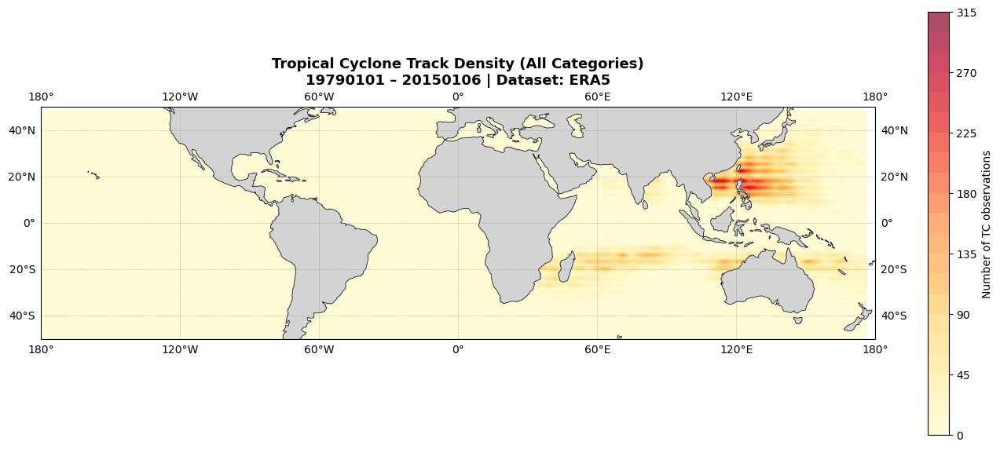

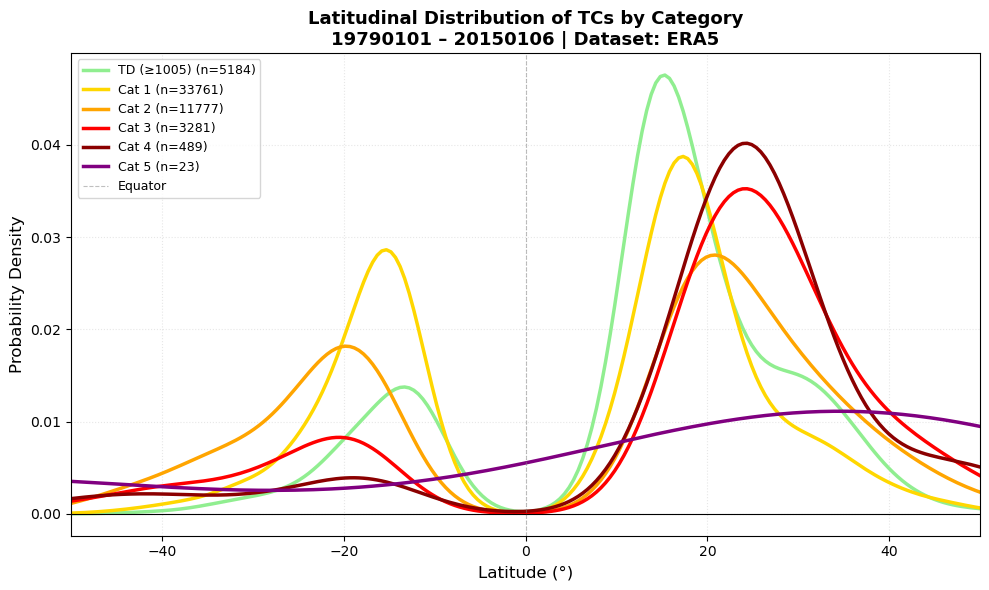

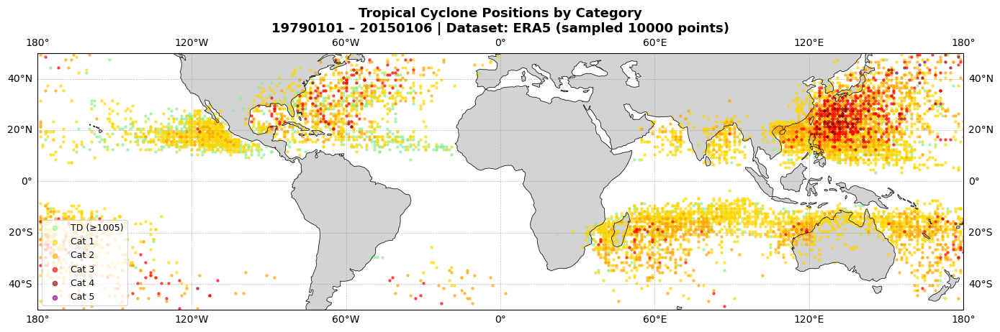


STATISTICHE SPAZIALI PER CATEGORIA
Cat    N punti    Lat media    Lat std     
------------------------------------------------------------
0      5184            12.74°      16.84°
1      33761            5.37°      20.33°
2      11777            6.97°      25.96°
3      3281            16.45°      24.23°
4      489             19.89°      21.55°
5      23              10.85°      41.86°


In [18]:
# ===========================================
# ANALISI SPAZIALE DEI CICLONI TROPICALI
# ===========================================
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Funzione di categorizzazione
def category_from_slp_pa(slp_pa):
    slp_hpa = slp_pa / 100.0
    if slp_hpa >= 1005:
        return 0
    elif slp_hpa >= 990:
        return 1
    elif slp_hpa >= 975:
        return 2
    elif slp_hpa >= 960:
        return 3
    elif slp_hpa >= 945:
        return 4
    else:
        return 5

# ===========================================
# 1. CARICA TUTTI I PUNTI DEI CICLONI
# ===========================================
points_data = {
    'lon': [],
    'lat': [],
    'slp': [],
    'category': [],
    'storm_id': []
}

with open(filtered_file, 'r') as f:
    for line in f:
        if 'track_id' in line or 'year' in line:
            continue
        
        parts = line.strip().split()
        if len(parts) != 12:
            continue
        
        storm_id = parts[0]
        lon = float(parts[7])
        lat = float(parts[8])
        slp_pa = float(parts[9])
        
        category = category_from_slp_pa(slp_pa)
        
        points_data['storm_id'].append(storm_id)
        points_data['lon'].append(lon)
        points_data['lat'].append(lat)
        points_data['slp'].append(slp_pa / 100.0)  # converti in hPa
        points_data['category'].append(category)

# Converti in array numpy
for key in points_data:
    points_data[key] = np.array(points_data[key])

print(f"Totale punti: {len(points_data['lon'])}")
print(f"Range lon: {points_data['lon'].min():.1f} - {points_data['lon'].max():.1f}")
print(f"Range lat: {points_data['lat'].min():.1f} - {points_data['lat'].max():.1f}")

# ===========================================
# 2. HEATMAP 2D - DENSITÀ SPAZIALE GENERALE
# ===========================================
fig = plt.figure(figsize=(14, 8))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([-180, 180, -50, 50], crs=ccrs.PlateCarree())

# Calcola heatmap 2D
lon_bins = np.linspace(-180, 180, 100)
lat_bins = np.linspace(-50, 50, 70)
H, xedges, yedges = np.histogram2d(points_data['lon'], points_data['lat'], 
                                    bins=[lon_bins, lat_bins])

# Plot heatmap
im = ax.contourf(xedges[:-1], yedges[:-1], H.T, levels=20, 
                 cmap='YlOrRd', transform=ccrs.PlateCarree(), alpha=0.7)

# Aggiungi features geografiche
ax.add_feature(cfeature.LAND, color='lightgray', zorder=1)
ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')

plt.colorbar(im, ax=ax, label='Number of TC observations', shrink=0.7)
plt.title(f'Tropical Cyclone Track Density (All Categories)\n'
          f'{config["time"]["startdate"]} – {config["time"]["enddate"]} | '
          f'Dataset: {config["dataset"]["model"]}',
          fontsize=13, fontweight='bold')

# Salva
startdate = config['time']['startdate']
enddate = config['time']['enddate']
plotdir = config['paths']['plotdir']
os.makedirs(plotdir, exist_ok=True)

plt.tight_layout()
plt.savefig(os.path.join(plotdir, 
            f'tc_density_map_{config["dataset"]["model"]}_{config["dataset"]["exp"]}_{startdate}_{enddate}.pdf'),
            dpi=300, bbox_inches='tight')
plt.show()

# ===========================================
# 3. DISTRIBUZIONE LATITUDINALE PER CATEGORIA (SENZA RIEMPIMENTO)
# ===========================================
fig, ax = plt.subplots(figsize=(10, 6))

colors = ['lightgreen', 'gold', 'orange', 'red', 'darkred', 'purple']
cat_names = ['TD (≥1005)', 'Cat 1', 'Cat 2', 'Cat 3', 'Cat 4', 'Cat 5']

for cat in range(6):
    mask = points_data['category'] == cat
    if mask.sum() == 0:
        continue
    
    lat_cat = points_data['lat'][mask]
    
    # KDE per la distribuzione latitudinale
    if len(lat_cat) > 1:
        kde = gaussian_kde(lat_cat)
        lat_range = np.linspace(-50, 50, 200)
        density = kde(lat_range)
        
        ax.plot(lat_range, density, linewidth=2.5, 
                color=colors[cat], label=f'{cat_names[cat]} (n={len(lat_cat)})')
        # RIMOSSO: ax.fill_between(...)

ax.set_xlabel('Latitude (°)', fontsize=12)
ax.set_ylabel('Probability Density', fontsize=12)
ax.set_title(f'Latitudinal Distribution of TCs by Category\n'
             f'{startdate} – {enddate} | Dataset: {config["dataset"]["model"]}',
             fontsize=13, fontweight='bold')
ax.axhline(0, color='black', linewidth=0.8)
ax.axvline(0, color='gray', linewidth=0.8, linestyle='--', alpha=0.5, label='Equator')
ax.legend(fontsize=9, loc='upper left')
ax.grid(alpha=0.3, linestyle=':')
ax.set_xlim(-50, 50)

plt.tight_layout()
plt.savefig(os.path.join(plotdir, 
            f'tc_latitude_distribution_{config["dataset"]["model"]}_{config["dataset"]["exp"]}_{startdate}_{enddate}.pdf'),
            dpi=300, bbox_inches='tight')
plt.show()

# ===========================================
# 4. MAPPA CON PUNTI COLORATI PER CATEGORIA
# ===========================================
fig = plt.figure(figsize=(14, 8))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([-180, 180, -50, 50], crs=ccrs.PlateCarree())

# Plot punti per categoria (campiona per evitare troppi punti)
sample_size = min(10000, len(points_data['lon']))
indices = np.random.choice(len(points_data['lon']), sample_size, replace=False)

for cat in range(6):
    mask = points_data['category'][indices] == cat
    if mask.sum() == 0:
        continue
    
    ax.scatter(points_data['lon'][indices][mask], 
               points_data['lat'][indices][mask],
               c=colors[cat], s=5, alpha=0.6, 
               label=f'{cat_names[cat]}',
               transform=ccrs.PlateCarree())

ax.add_feature(cfeature.LAND, color='lightgray', zorder=0)
ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')

plt.legend(fontsize=9, loc='lower left', markerscale=2)
plt.title(f'Tropical Cyclone Positions by Category\n'
          f'{startdate} – {enddate} | Dataset: {config["dataset"]["model"]} '
          f'(sampled {sample_size} points)',
          fontsize=13, fontweight='bold')

plt.tight_layout()
plt.savefig(os.path.join(plotdir, 
            f'tc_positions_by_category_{config["dataset"]["model"]}_{config["dataset"]["exp"]}_{startdate}_{enddate}.pdf'),
            dpi=300, bbox_inches='tight')
plt.show()

# ===========================================
# 5. STATISTICHE PER CATEGORIA
# ===========================================
print("\n" + "="*60)
print("STATISTICHE SPAZIALI PER CATEGORIA")
print("="*60)
print(f"{'Cat':<6} {'N punti':<10} {'Lat media':<12} {'Lat std':<12}")
print("-"*60)
for cat in range(6):
    mask = points_data['category'] == cat
    n_points = mask.sum()
    if n_points > 0:
        lat_mean = points_data['lat'][mask].mean()
        lat_std = points_data['lat'][mask].std()
        print(f"{cat:<6} {n_points:<10} {lat_mean:>10.2f}° {lat_std:>10.2f}°")

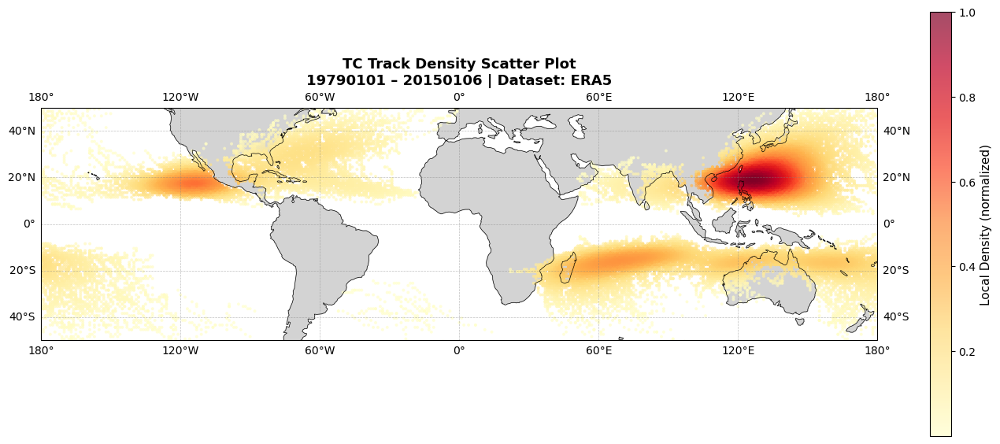

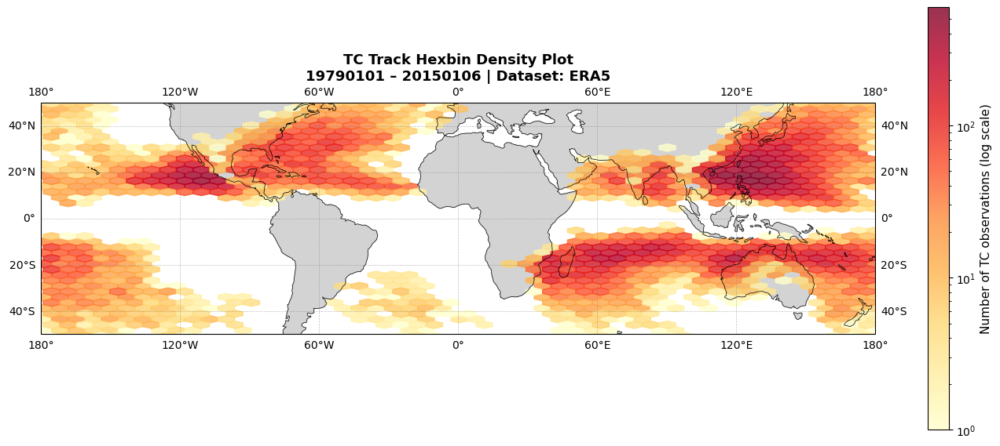

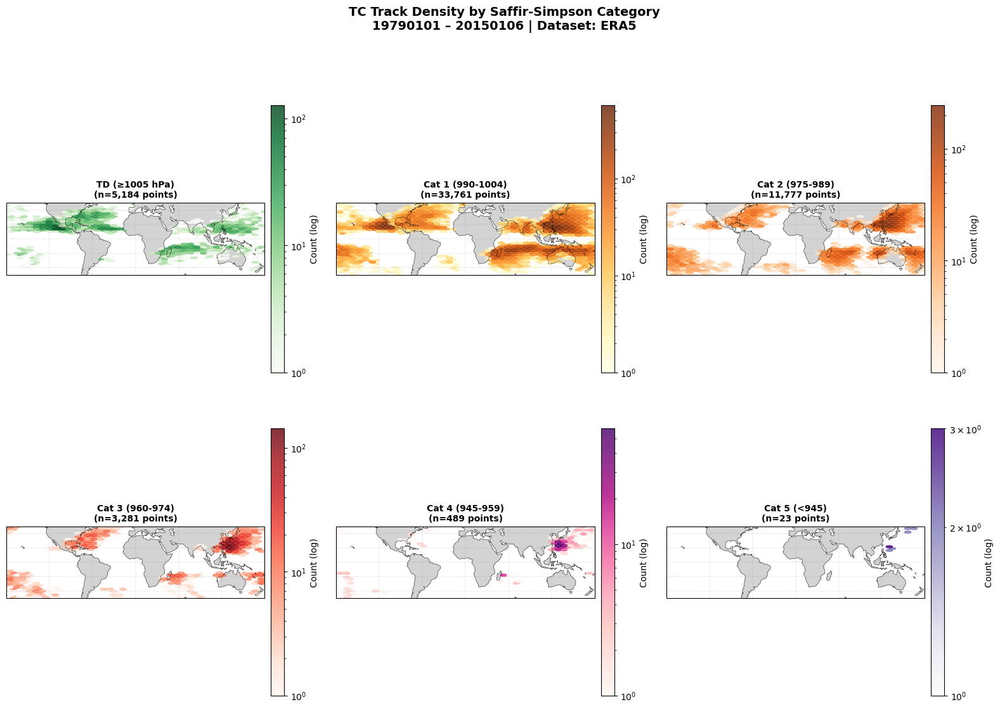


STATISTICHE PER BACINO OCEANICO
Bacino                    Totale punti    % del totale   
----------------------------------------------------------------------
West Pacific              19,535                   35.8%
Other                     17,809                   32.7%
South Indian              8,197                    15.0%
South Pacific (East)      7,275                    13.3%
North Indian              1,699                     3.1%

DISTRIBUZIONE PER CATEGORIA E BACINO (Top 3 bacini)

Categoria 0 (TD (≥1005 hPa)):
  Other                      3,417 punti
  West Pacific                 779 punti
  South Indian                 692 punti

Categoria 1 (Cat 1 (990-1004)):
  West Pacific              11,169 punti
  Other                     10,306 punti
  South Indian               5,782 punti

Categoria 2 (Cat 2 (975-989)):
  West Pacific               5,253 punti
  Other                      3,012 punti
  South Pacific (East)       1,679 punti

Categoria 3 (Cat 3 (960-974)):
  W

In [19]:
# ===========================================
# DENSITY SCATTER PLOTS - ANALISI STATISTICA SPAZIALE
# ===========================================
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from scipy.stats import gaussian_kde

# ===========================================
# 1. DENSITY SCATTER - Colore indica densità locale
# ===========================================
fig = plt.figure(figsize=(14, 8))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([-180, 180, -50, 50], crs=ccrs.PlateCarree())

# Calcola densità locale per ogni punto usando KDE
lon = points_data['lon']
lat = points_data['lat']

# Campiona per performance (se troppi punti)
if len(lon) > 50000:
    indices = np.random.choice(len(lon), 50000, replace=False)
    lon_sample = lon[indices]
    lat_sample = lat[indices]
else:
    lon_sample = lon
    lat_sample = lat

# KDE per calcolare densità
try:
    xy = np.vstack([lon_sample, lat_sample])
    kde = gaussian_kde(xy)
    density = kde(xy)
    
    # Normalizza per visualizzazione
    density = density / density.max()
    
    # Plot con colore basato su densità
    scatter = ax.scatter(lon_sample, lat_sample, c=density, 
                        s=8, alpha=0.7, cmap='YlOrRd',
                        transform=ccrs.PlateCarree(),
                        edgecolors='none')
    
    cbar = plt.colorbar(scatter, ax=ax, shrink=0.7, pad=0.05)
    cbar.set_label('Local Density (normalized)', fontsize=11)
    
except Exception as e:
    print(f"KDE failed, using simple scatter: {e}")
    scatter = ax.scatter(lon_sample, lat_sample, 
                        s=5, alpha=0.5, color='blue',
                        transform=ccrs.PlateCarree())

ax.add_feature(cfeature.LAND, color='lightgray', zorder=0)
ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')

plt.title(f'TC Track Density Scatter Plot\n'
          f'{startdate} – {enddate} | Dataset: {config["dataset"]["model"]}',
          fontsize=13, fontweight='bold')

plt.tight_layout()
plt.savefig(os.path.join(plotdir, 
            f'tc_density_scatter_{config["dataset"]["model"]}_{config["dataset"]["exp"]}_{startdate}_{enddate}.pdf'),
            dpi=300, bbox_inches='tight')
plt.show()

# ===========================================
# 2. HEXBIN PLOT - Celle esagonali (migliore per grandi dataset)
# ===========================================
fig = plt.figure(figsize=(14, 8))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([-180, 180, -50, 50], crs=ccrs.PlateCarree())

# Hexbin (più efficiente di scatter per molti punti)
hexbin = ax.hexbin(points_data['lon'], points_data['lat'], 
                   gridsize=50, cmap='YlOrRd', 
                   mincnt=1, bins='log',
                   transform=ccrs.PlateCarree(),
                   alpha=0.8)

cbar = plt.colorbar(hexbin, ax=ax, shrink=0.7, pad=0.05)
cbar.set_label('Number of TC observations (log scale)', fontsize=11)

ax.add_feature(cfeature.LAND, color='lightgray', zorder=0)
ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')

plt.title(f'TC Track Hexbin Density Plot\n'
          f'{startdate} – {enddate} | Dataset: {config["dataset"]["model"]}',
          fontsize=13, fontweight='bold')

plt.tight_layout()
plt.savefig(os.path.join(plotdir, 
            f'tc_hexbin_density_{config["dataset"]["model"]}_{config["dataset"]["exp"]}_{startdate}_{enddate}.pdf'),
            dpi=300, bbox_inches='tight')
plt.show()

# ===========================================
# 3. DENSITY SCATTER PER CATEGORIA - 6 subplot
# ===========================================
fig = plt.figure(figsize=(16, 12))

colors_map = ['Greens', 'YlOrBr', 'Oranges', 'Reds', 'RdPu', 'Purples']
cat_names = ['TD (≥1005 hPa)', 'Cat 1 (990-1004)', 'Cat 2 (975-989)', 
             'Cat 3 (960-974)', 'Cat 4 (945-959)', 'Cat 5 (<945)']

for cat in range(6):
    ax = plt.subplot(2, 3, cat+1, projection=ccrs.PlateCarree())
    ax.set_extent([-180, 180, -50, 50], crs=ccrs.PlateCarree())
    
    mask = points_data['category'] == cat
    n_points = mask.sum()
    
    if n_points > 0:
        lon_cat = points_data['lon'][mask]
        lat_cat = points_data['lat'][mask]
        
        # Hexbin per categoria
        hexbin = ax.hexbin(lon_cat, lat_cat, 
                          gridsize=40, cmap=colors_map[cat],
                          mincnt=1, bins='log',
                          transform=ccrs.PlateCarree(),
                          alpha=0.8)
        
        plt.colorbar(hexbin, ax=ax, shrink=0.7, pad=0.02, 
                    label='Count (log)')
    
    ax.add_feature(cfeature.LAND, color='lightgray', zorder=0)
    ax.add_feature(cfeature.COASTLINE, linewidth=0.3)
    ax.gridlines(linewidth=0.3, color='gray', alpha=0.5, linestyle='--')
    
    ax.set_title(f'{cat_names[cat]}\n(n={n_points:,} points)', 
                fontsize=10, fontweight='bold')

plt.suptitle(f'TC Track Density by Saffir-Simpson Category\n'
             f'{startdate} – {enddate} | Dataset: {config["dataset"]["model"]}',
             fontsize=14, fontweight='bold', y=0.995)

plt.tight_layout()
plt.savefig(os.path.join(plotdir, 
            f'tc_density_by_category_{config["dataset"]["model"]}_{config["dataset"]["exp"]}_{startdate}_{enddate}.pdf'),
            dpi=300, bbox_inches='tight')
plt.show()

# ===========================================
# 4. STATISTICHE DENSITÀ PER BACINO OCEANICO
# ===========================================
# Definisci bacini oceanici (semplificato)
def get_basin(lon, lat):
    if -100 <= lon <= -10 and 5 <= lat <= 40:
        return 'North Atlantic'
    elif -180 <= lon <= -80 and 5 <= lat <= 40:
        return 'East Pacific'
    elif 100 <= lon <= 180 and 5 <= lat <= 40:
        return 'West Pacific'
    elif 40 <= lon <= 100 and -5 <= lat <= 30:
        return 'North Indian'
    elif 20 <= lon <= 90 and -40 <= lat <= -5:
        return 'South Indian'
    elif -180 <= lon <= -100 and -40 <= lat <= -5:
        return 'South Pacific (West)'
    elif 100 <= lon <= 180 and -40 <= lat <= -5:
        return 'South Pacific (East)'
    else:
        return 'Other'

# Conta per bacino
basin_counts = {}
basin_by_cat = {cat: {} for cat in range(6)}

for i in range(len(points_data['lon'])):
    basin = get_basin(points_data['lon'][i], points_data['lat'][i])
    cat = points_data['category'][i]
    
    basin_counts[basin] = basin_counts.get(basin, 0) + 1
    basin_by_cat[cat][basin] = basin_by_cat[cat].get(basin, 0) + 1

print("\n" + "="*70)
print("STATISTICHE PER BACINO OCEANICO")
print("="*70)
print(f"{'Bacino':<25} {'Totale punti':<15} {'% del totale':<15}")
print("-"*70)
total = sum(basin_counts.values())
for basin, count in sorted(basin_counts.items(), key=lambda x: -x[1]):
    pct = count / total * 100
    print(f"{basin:<25} {count:<15,} {pct:>13.1f}%")

print("\n" + "="*70)
print("DISTRIBUZIONE PER CATEGORIA E BACINO (Top 3 bacini)")
print("="*70)
for cat in range(6):
    print(f"\nCategoria {cat} ({cat_names[cat]}):")
    if basin_by_cat[cat]:
        top_basins = sorted(basin_by_cat[cat].items(), key=lambda x: -x[1])[:3]
        for basin, count in top_basins:
            print(f"  {basin:<25} {count:>6,} punti")


STATISTICHE PER BACINO OCEANICO (IBTrACS Standard)
Bacino               Totale punti    % totale     SLP medio (hPa)
--------------------------------------------------------------------------------
West Pacific         20,375                37.4%              990.2
North Indian         1,696                  3.1%              995.8
South Indian         11,847                21.7%              996.0
South Pacific        4,380                  8.0%              993.3
Other                16,217                29.7%              996.7


2025-12-17 18:01:54,574 - distributed.nanny - ERROR - Worker process died unexpectedly
Process Dask Worker process (from Nanny):
Traceback (most recent call last):
  File "/work/users/mccorda/miniforge3/envs/aqua-diagnostics/lib/python3.12/asyncio/runners.py", line 118, in run
    return self._loop.run_until_complete(task)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/work/users/mccorda/miniforge3/envs/aqua-diagnostics/lib/python3.12/asyncio/base_events.py", line 691, in run_until_complete
    return future.result()
           ^^^^^^^^^^^^^^^
  File "/work/users/mccorda/miniforge3/envs/aqua-diagnostics/lib/python3.12/site-packages/distributed/nanny.py", line 985, in run
    await worker.finished()
  File "/work/users/mccorda/miniforge3/envs/aqua-diagnostics/lib/python3.12/site-packages/distributed/core.py", line 494, in finished
    await self._event_finished.wait()
  File "/work/users/mccorda/miniforge3/envs/aqua-diagnostics/lib/python3.12/asyncio/locks.py", line 212, in wai

KeyboardInterrupt: 

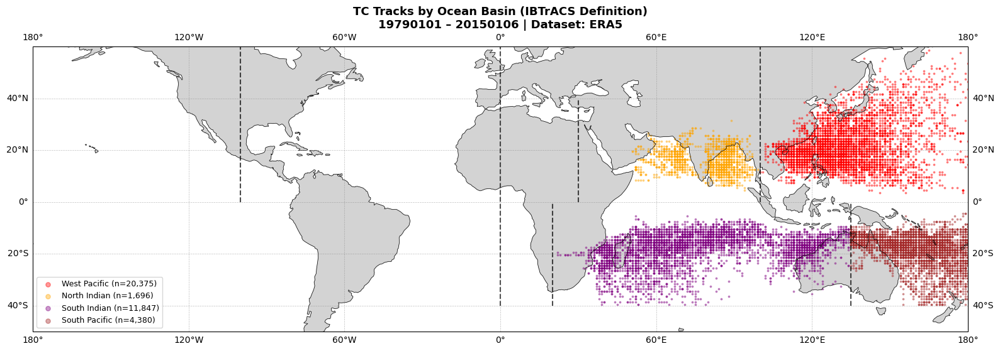

In [18]:
# ma questa mi sa che no
#  ===========================================
# DEFINIZIONE BACINI OCEANICI - STANDARD IBTrACS
# ===========================================

def get_basin_ibtracs(lon, lat):
    """
    Classificazione basata su IBTrACS (WMO standard)
    Riferimento: https://www.ncei.noaa.gov/products/international-best-track-archive
    """
    # North Atlantic (NA)
    if -100 <= lon <= 0 and 0 <= lat <= 70:
        return 'North Atlantic'
    
    # Eastern Pacific (EP) 
    if -180 <= lon < -100 and 0 <= lat <= 60:
        return 'East Pacific'
    
    # Western Pacific (WP) - Include South China Sea
    if 100 <= lon <= 180 and 0 <= lat <= 60:
        return 'West Pacific'
    
    # North Indian Ocean (NI) - Bay of Bengal + Arabian Sea
    if 30 <= lon < 100 and 0 <= lat <= 40:
        return 'North Indian'
    
    # South Indian Ocean (SI)
    if 20 <= lon < 135 and -40 <= lat < 0:
        return 'South Indian'
    
    # South Pacific (SP)
    if (135 <= lon <= 180 or -180 <= lon <= -120) and -40 <= lat < 0:
        return 'South Pacific'
    
    # South Atlantic (SA) - rari ma esistono
    if -70 <= lon <= 20 and -40 <= lat < 0:
        return 'South Atlantic'
    
    return 'Other'

# ===========================================
# STATISTICHE PER BACINO CON DEFINIZIONE IBTrACS
# ===========================================
basin_counts = {}
basin_by_cat = {cat: {} for cat in range(6)}
basin_intensities = {}  # Per calcolare SLP medio per bacino

for i in range(len(points_data['lon'])):
    basin = get_basin_ibtracs(points_data['lon'][i], points_data['lat'][i])
    cat = points_data['category'][i]
    slp = points_data['slp'][i]
    
    # Conta totali
    basin_counts[basin] = basin_counts.get(basin, 0) + 1
    
    # Conta per categoria
    basin_by_cat[cat][basin] = basin_by_cat[cat].get(basin, 0) + 1
    
    # Accumula SLP per calcolare media
    if basin not in basin_intensities:
        basin_intensities[basin] = []
    basin_intensities[basin].append(slp)

# Calcola SLP medio per bacino
basin_avg_slp = {basin: np.mean(slps) for basin, slps in basin_intensities.items()}

print("\n" + "="*80)
print("STATISTICHE PER BACINO OCEANICO (IBTrACS Standard)")
print("="*80)
print(f"{'Bacino':<20} {'Totale punti':<15} {'% totale':<12} {'SLP medio (hPa)':<15}")
print("-"*80)

total = sum(basin_counts.values())
for basin in ['North Atlantic', 'East Pacific', 'West Pacific', 'North Indian', 
              'South Indian', 'South Pacific', 'South Atlantic', 'Other']:
    if basin in basin_counts:
        count = basin_counts[basin]
        pct = count / total * 100
        avg_slp = basin_avg_slp[basin]
        print(f"{basin:<20} {count:<15,} {pct:>10.1f}% {avg_slp:>18.1f}")

# ===========================================
# MAPPA CON CONFINI DEI BACINI
# ===========================================
fig = plt.figure(figsize=(16, 9))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([-180, 180, -50, 60], crs=ccrs.PlateCarree())

# Colori per bacino
basin_colors = {
    'North Atlantic': 'blue',
    'East Pacific': 'green',
    'West Pacific': 'red',
    'North Indian': 'orange',
    'South Indian': 'purple',
    'South Pacific': 'brown',
    'South Atlantic': 'pink'
}

# Plot punti colorati per bacino
for basin, color in basin_colors.items():
    basin_mask = np.array([get_basin_ibtracs(lon, lat) == basin 
                           for lon, lat in zip(points_data['lon'], points_data['lat'])])
    
    if basin_mask.sum() > 0:
        # Campiona per performance
        indices = np.where(basin_mask)[0]
        if len(indices) > 5000:
            indices = np.random.choice(indices, 5000, replace=False)
        
        ax.scatter(points_data['lon'][indices], points_data['lat'][indices],
                  c=color, s=3, alpha=0.4, label=f'{basin} (n={basin_mask.sum():,})',
                  transform=ccrs.PlateCarree())

# Disegna confini dei bacini
ax.plot([0, 0], [-40, 70], 'k--', linewidth=1.5, alpha=0.7, transform=ccrs.PlateCarree())
ax.plot([-100, -100], [0, 60], 'k--', linewidth=1.5, alpha=0.7, transform=ccrs.PlateCarree())
ax.plot([100, 100], [0, 60], 'k--', linewidth=1.5, alpha=0.7, transform=ccrs.PlateCarree())
ax.plot([30, 30], [0, 40], 'k--', linewidth=1.5, alpha=0.7, transform=ccrs.PlateCarree())
ax.plot([135, 135], [-40, 0], 'k--', linewidth=1.5, alpha=0.7, transform=ccrs.PlateCarree())
ax.plot([20, 20], [-40, 0], 'k--', linewidth=1.5, alpha=0.7, transform=ccrs.PlateCarree())

ax.add_feature(cfeature.LAND, color='lightgray', zorder=0)
ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')

plt.legend(fontsize=9, loc='lower left', markerscale=3)
plt.title(f'TC Tracks by Ocean Basin (IBTrACS Definition)\n'
          f'{startdate} – {enddate} | Dataset: {config["dataset"]["model"]}',
          fontsize=13, fontweight='bold')

plt.tight_layout()
plt.savefig(os.path.join(plotdir, 
            f'tc_by_basin_{config["dataset"]["model"]}_{config["dataset"]["exp"]}_{startdate}_{enddate}.pdf'),
            dpi=300, bbox_inches='tight')
plt.show()

# ===========================================
# MATRICE CATEGORIA vs BACINO (Heatmap)
# ===========================================
# Crea matrice
basins_ordered = ['North Atlantic', 'East Pacific', 'West Pacific', 'North Indian', 
                  'South Indian', 'South Pacific', 'South Atlantic']
categories_range = range(6)

matrix = np.zeros((6, len(basins_ordered)))
for cat in categories_range:
    for j, basin in enumerate(basins_ordered):
        if basin in basin_by_cat[cat]:
            matrix[cat, j] = basin_by_cat[cat][basin]

fig, ax = plt.subplots(figsize=(12, 7))

im = ax.imshow(matrix, cmap='YlOrRd', aspect='auto')

# Aggiungi numeri nelle celle
for i in range(6):
    for j in range(len(basins_ordered)):
        count = int(matrix[i, j])
        if count > 0:
            text = ax.text(j, i, f'{count:,}',
                          ha="center", va="center", color="black" if count < matrix.max()/2 else "white",
                          fontsize=10, fontweight='bold')

ax.set_xticks(np.arange(len(basins_ordered)))
ax.set_yticks(np.arange(6))
ax.set_xticklabels(basins_ordered, rotation=45, ha='right')
ax.set_yticklabels(['TD', 'Cat 1', 'Cat 2', 'Cat 3', 'Cat 4', 'Cat 5'])

ax.set_xlabel('Ocean Basin', fontsize=12)
ax.set_ylabel('Saffir-Simpson Category', fontsize=12)
ax.set_title(f'TC Frequency Matrix: Category vs Basin\n'
             f'{startdate} – {enddate} | Dataset: {config["dataset"]["model"]}',
             fontsize=13, fontweight='bold')

cbar = plt.colorbar(im, ax=ax, pad=0.02)
cbar.set_label('Number of observations', fontsize=11)

plt.tight_layout()
plt.savefig(os.path.join(plotdir, 
            f'tc_category_basin_matrix_{config["dataset"]["model"]}_{config["dataset"]["exp"]}_{startdate}_{enddate}.pdf'),
            dpi=300, bbox_inches='tight')
plt.show()

# ===========================================
# STATISTICHE DETTAGLIATE PER CATEGORIA E BACINO
# ===========================================
print("\n" + "="*80)
print("DISTRIBUZIONE PER CATEGORIA E BACINO")
print("="*80)

cat_names_short = ['TD', 'Cat1', 'Cat2', 'Cat3', 'Cat4', 'Cat5']
for cat in range(6):
    print(f"\n{cat_names[cat]}:")
    print(f"{'Bacino':<20} {'Count':<12} {'% of category':<15}")
    print("-"*50)
    
    cat_total = sum(basin_by_cat[cat].values())
    if cat_total > 0:
        for basin in basins_ordered:
            if basin in basin_by_cat[cat]:
                count = basin_by_cat[cat][basin]
                pct = count / cat_total * 100
                print(f"{basin:<20} {count:<12,} {pct:>13.1f}%")

✓ Dati già in memoria: 54515 punti

STATISTICHE PER BACINO OCEANICO (IBTrACS Standard)
Bacino               Totale punti    % totale     SLP medio (hPa)
--------------------------------------------------------------------------------
North Atlantic       6,630                 12.2%              996.1
East Pacific         6,488                 11.9%             1000.9
West Pacific         20,356                37.3%              990.2
North Indian         1,696                  3.1%              995.8
South Indian         11,847                21.7%              996.0
South Pacific        6,890                 12.6%              992.3
Other                608                    1.1%              982.3


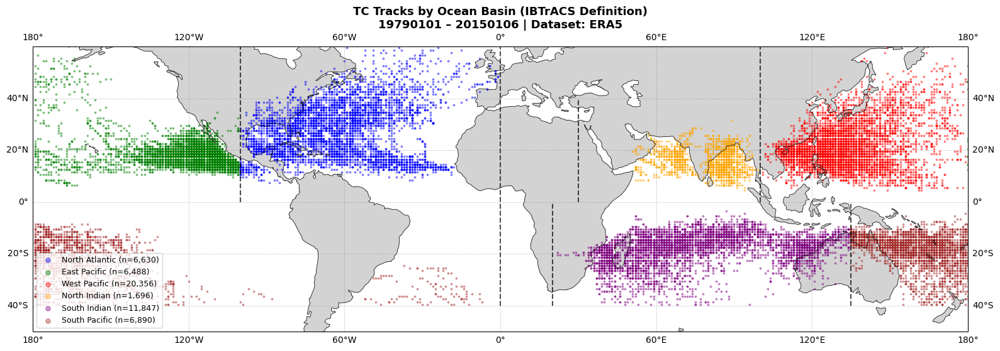

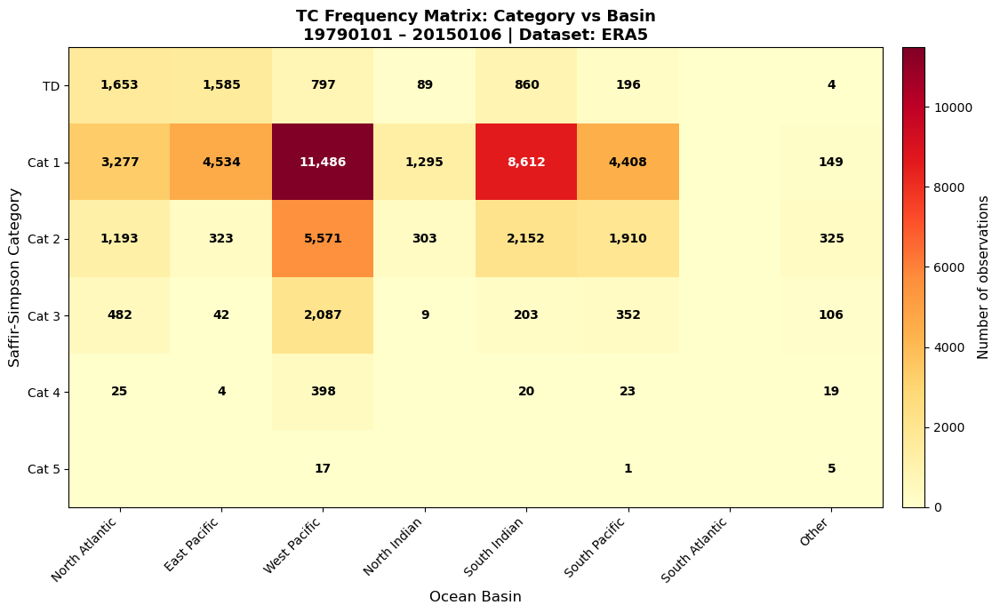


DISTRIBUZIONE PER CATEGORIA E BACINO

TD (≥1005 hPa):
Bacino               Count        % of category  
--------------------------------------------------
North Atlantic       1,653                 31.9%
East Pacific         1,585                 30.6%
West Pacific         797                   15.4%
North Indian         89                     1.7%
South Indian         860                   16.6%
South Pacific        196                    3.8%
Other                4                      0.1%

Cat 1 (990-1004):
Bacino               Count        % of category  
--------------------------------------------------
North Atlantic       3,277                  9.7%
East Pacific         4,534                 13.4%
West Pacific         11,486                34.0%
North Indian         1,295                  3.8%
South Indian         8,612                 25.5%
South Pacific        4,408                 13.1%
Other                149                    0.4%

Cat 2 (975-989):
Bacino              

In [20]:
# ===========================================
# ANALISI PER BACINI OCEANICI (IBTrACS Standard)
# ===========================================
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Funzione di categorizzazione
def category_from_slp_pa(slp_pa):
    slp_hpa = slp_pa / 100.0
    if slp_hpa >= 1005:
        return 0
    elif slp_hpa >= 990:
        return 1
    elif slp_hpa >= 975:
        return 2
    elif slp_hpa >= 960:
        return 3
    elif slp_hpa >= 945:
        return 4
    else:
        return 5

# ===========================================
# 1. CARICA DATI (se non già caricati)
# ===========================================
if 'points_data' not in globals():
    print("Caricamento dati in corso...")
    points_data = {
        'lon': [],
        'lat': [],
        'slp': [],
        'category': [],
        'storm_id': []
    }

    with open(filtered_file, 'r') as f:
        for line in f:
            if 'track_id' in line or 'year' in line:
                continue
            
            parts = line.strip().split()
            if len(parts) != 12:
                continue
            
            storm_id = parts[0]
            lon = float(parts[7])
            lat = float(parts[8])
            slp_pa = float(parts[9])
            
            category = category_from_slp_pa(slp_pa)
            
            points_data['storm_id'].append(storm_id)
            points_data['lon'].append(lon)
            points_data['lat'].append(lat)
            points_data['slp'].append(slp_pa / 100.0)
            points_data['category'].append(category)

    # Converti in array numpy
    for key in points_data:
        points_data[key] = np.array(points_data[key])
    
    print(f"✓ Dati caricati: {len(points_data['lon'])} punti")
else:
    print(f"✓ Dati già in memoria: {len(points_data['lon'])} punti")

# ===========================================
# 2. DEFINIZIONE BACINI OCEANICI - STANDARD IBTrACS
# ===========================================
# ===========================================
# CLIMATOLOGIA MENSILE PER BACINO (avanzata) - CORRETTA
# ===========================================

# Funzione bacini (se non già definita)
def get_basin_ibtracs(lon, lat):
    """Classificazione basata su IBTrACS (WMO standard)"""
    lon_360 = lon if lon >= 0 else lon + 360
    
    if (260 <= lon_360 <= 360 or 0 <= lon_360 <= 0) and 0 <= lat <= 70:
        return 'North Atlantic'
    if 180 <= lon_360 < 260 and 0 <= lat <= 60:
        return 'East Pacific'
    if 100 <= lon_360 < 180 and 0 <= lat <= 60:
        return 'West Pacific'
    if 30 <= lon_360 < 100 and 0 <= lat <= 40:
        return 'North Indian'
    if 20 <= lon_360 < 135 and -40 <= lat < 0:
        return 'South Indian'
    if (135 <= lon_360 <= 360 or 0 <= lon_360 < 240) and -40 <= lat < 0:
        return 'South Pacific'
    if (290 <= lon_360 <= 360 or 0 <= lon_360 <= 20) and -40 <= lat < 0:
        return 'South Atlantic'
    return 'Other'

# Bacini principali da analizzare
basins_to_plot = ['North Atlantic', 'East Pacific', 'West Pacific', 
                  'North Indian', 'South Indian', 'South Pacific']

# ===========================================
# 3. CALCOLA STATISTICHE PER BACINO
# ===========================================
basin_counts = {}
basin_by_cat = {cat: {} for cat in range(6)}
basin_intensities = {}

for i in range(len(points_data['lon'])):
    basin = get_basin_ibtracs(points_data['lon'][i], points_data['lat'][i])
    cat = points_data['category'][i]
    slp = points_data['slp'][i]
    
    basin_counts[basin] = basin_counts.get(basin, 0) + 1
    basin_by_cat[cat][basin] = basin_by_cat[cat].get(basin, 0) + 1
    
    if basin not in basin_intensities:
        basin_intensities[basin] = []
    basin_intensities[basin].append(slp)

basin_avg_slp = {basin: np.mean(slps) for basin, slps in basin_intensities.items()}

# ===========================================
# 4. STAMPA STATISTICHE
# ===========================================
print("\n" + "="*80)
print("STATISTICHE PER BACINO OCEANICO (IBTrACS Standard)")
print("="*80)
print(f"{'Bacino':<20} {'Totale punti':<15} {'% totale':<12} {'SLP medio (hPa)':<15}")
print("-"*80)

total = sum(basin_counts.values())
basins_ordered = ['North Atlantic', 'East Pacific', 'West Pacific', 'North Indian', 
                  'South Indian', 'South Pacific', 'South Atlantic', 'Other']

for basin in basins_ordered:
    if basin in basin_counts:
        count = basin_counts[basin]
        pct = count / total * 100
        avg_slp = basin_avg_slp[basin]
        print(f"{basin:<20} {count:<15,} {pct:>10.1f}% {avg_slp:>18.1f}")

# ===========================================
# 5. MAPPA CON CONFINI DEI BACINI
# ===========================================
fig = plt.figure(figsize=(16, 9))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([-180, 180, -50, 60], crs=ccrs.PlateCarree())

basin_colors = {
    'North Atlantic': 'blue',
    'East Pacific': 'green',
    'West Pacific': 'red',
    'North Indian': 'orange',
    'South Indian': 'purple',
    'South Pacific': 'brown',
    'South Atlantic': 'pink'
}

# Plot punti per bacino
for basin, color in basin_colors.items():
    basin_mask = np.array([get_basin_ibtracs(lon, lat) == basin 
                           for lon, lat in zip(points_data['lon'], points_data['lat'])])
    
    if basin_mask.sum() > 0:
        indices = np.where(basin_mask)[0]
        if len(indices) > 5000:
            indices = np.random.choice(indices, 5000, replace=False)
        
        ax.scatter(points_data['lon'][indices], points_data['lat'][indices],
                  c=color, s=3, alpha=0.4, label=f'{basin} (n={basin_mask.sum():,})',
                  transform=ccrs.PlateCarree())

# Disegna confini
ax.plot([0, 0], [-40, 70], 'k--', linewidth=1.5, alpha=0.7, transform=ccrs.PlateCarree())
ax.plot([-100, -100], [0, 60], 'k--', linewidth=1.5, alpha=0.7, transform=ccrs.PlateCarree())
ax.plot([100, 100], [0, 60], 'k--', linewidth=1.5, alpha=0.7, transform=ccrs.PlateCarree())
ax.plot([30, 30], [0, 40], 'k--', linewidth=1.5, alpha=0.7, transform=ccrs.PlateCarree())
ax.plot([135, 135], [-40, 0], 'k--', linewidth=1.5, alpha=0.7, transform=ccrs.PlateCarree())
ax.plot([20, 20], [-40, 0], 'k--', linewidth=1.5, alpha=0.7, transform=ccrs.PlateCarree())

ax.add_feature(cfeature.LAND, color='lightgray', zorder=0)
ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')

plt.legend(fontsize=9, loc='lower left', markerscale=3)
plt.title(f'TC Tracks by Ocean Basin (IBTrACS Definition)\n'
          f'{startdate} – {enddate} | Dataset: {config["dataset"]["model"]}',
          fontsize=13, fontweight='bold')

plt.tight_layout()
plt.savefig(os.path.join(plotdir, 
            f'tc_by_basin_{config["dataset"]["model"]}_{config["dataset"]["exp"]}_{startdate}_{enddate}.pdf'),
            dpi=300, bbox_inches='tight')
plt.show()

# ===========================================
# 6. MATRICE HEATMAP CATEGORIA vs BACINO
# ===========================================
cat_names = ['TD (≥1005 hPa)', 'Cat 1 (990-1004)', 'Cat 2 (975-989)', 
             'Cat 3 (960-974)', 'Cat 4 (945-959)', 'Cat 5 (<945)']

matrix = np.zeros((6, len(basins_ordered)))
for cat in range(6):
    for j, basin in enumerate(basins_ordered):
        if basin in basin_by_cat[cat]:
            matrix[cat, j] = basin_by_cat[cat][basin]

fig, ax = plt.subplots(figsize=(12, 7))
im = ax.imshow(matrix, cmap='YlOrRd', aspect='auto')

# Numeri nelle celle
for i in range(6):
    for j in range(len(basins_ordered)):
        count = int(matrix[i, j])
        if count > 0:
            color = "white" if count > matrix.max()/2 else "black"
            ax.text(j, i, f'{count:,}', ha="center", va="center", 
                   color=color, fontsize=10, fontweight='bold')

ax.set_xticks(np.arange(len(basins_ordered)))
ax.set_yticks(np.arange(6))
ax.set_xticklabels(basins_ordered, rotation=45, ha='right')
ax.set_yticklabels(['TD', 'Cat 1', 'Cat 2', 'Cat 3', 'Cat 4', 'Cat 5'])

ax.set_xlabel('Ocean Basin', fontsize=12)
ax.set_ylabel('Saffir-Simpson Category', fontsize=12)
ax.set_title(f'TC Frequency Matrix: Category vs Basin\n'
             f'{startdate} – {enddate} | Dataset: {config["dataset"]["model"]}',
             fontsize=13, fontweight='bold')

cbar = plt.colorbar(im, ax=ax, pad=0.02)
cbar.set_label('Number of observations', fontsize=11)

plt.tight_layout()
plt.savefig(os.path.join(plotdir, 
            f'tc_category_basin_matrix_{config["dataset"]["model"]}_{config["dataset"]["exp"]}_{startdate}_{enddate}.pdf'),
            dpi=300, bbox_inches='tight')
plt.show()

# ===========================================
# 7. STATISTICHE DETTAGLIATE
# ===========================================
print("\n" + "="*80)
print("DISTRIBUZIONE PER CATEGORIA E BACINO")
print("="*80)

for cat in range(6):
    print(f"\n{cat_names[cat]}:")
    print(f"{'Bacino':<20} {'Count':<12} {'% of category':<15}")
    print("-"*50)
    
    cat_total = sum(basin_by_cat[cat].values())
    if cat_total > 0:
        for basin in basins_ordered:
            if basin in basin_by_cat[cat]:
                count = basin_by_cat[cat][basin]
                pct = count / cat_total * 100
                print(f"{basin:<20} {count:<12,} {pct:>13.1f}%")

✓ Dati già in memoria: 54515 punti


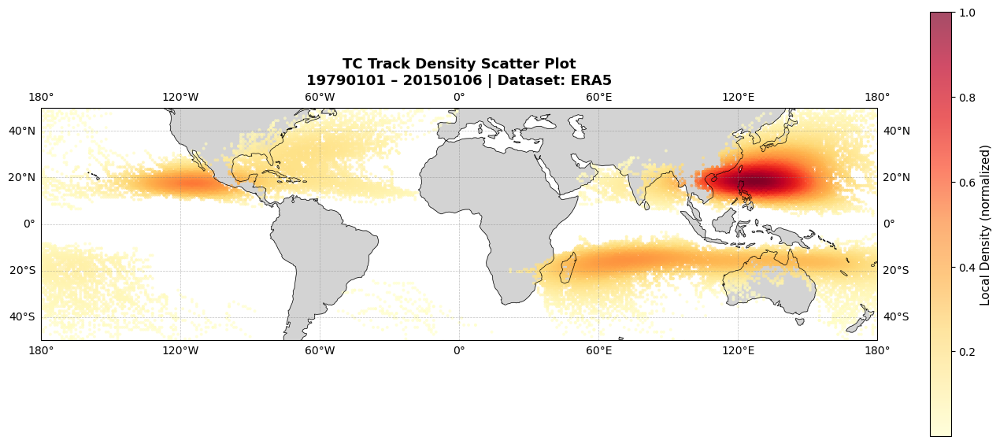

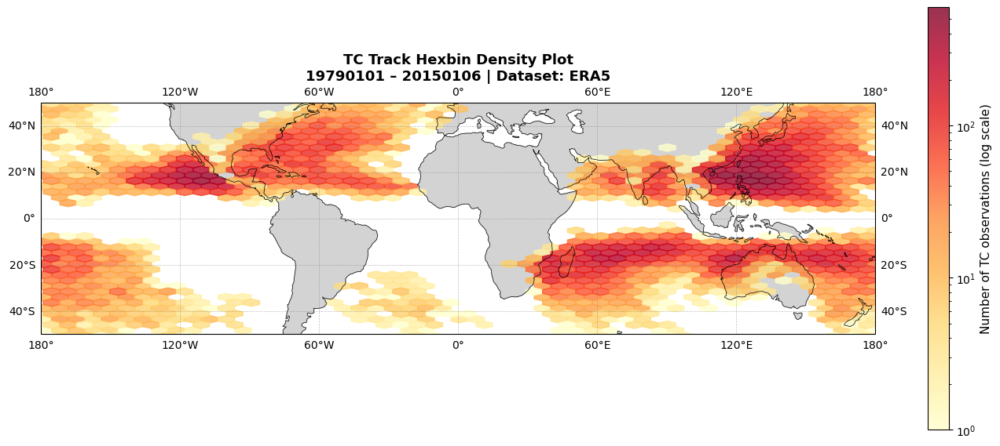

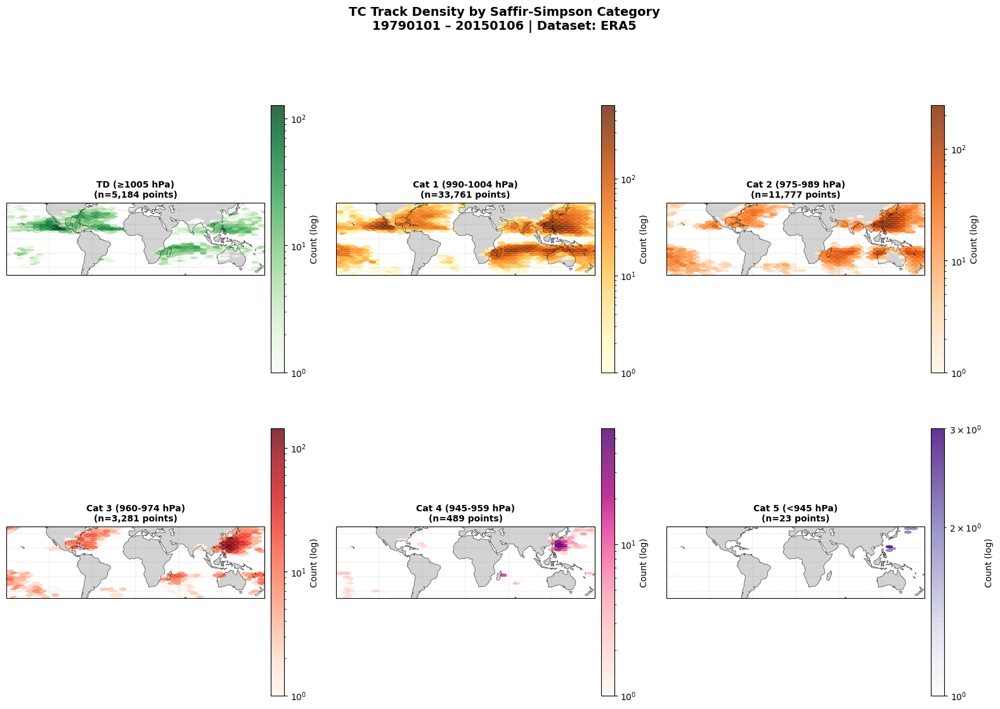

In [21]:
# ===========================================
# DENSITY SCATTER PLOTS - ANALISI STATISTICA SPAZIALE
# ===========================================
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from scipy.stats import gaussian_kde

# Funzione categoria (se non già definita)
def category_from_slp_pa(slp_pa):
    slp_hpa = slp_pa / 100.0
    if slp_hpa >= 1005:
        return 0
    elif slp_hpa >= 990:
        return 1
    elif slp_hpa >= 975:
        return 2
    elif slp_hpa >= 960:
        return 3
    elif slp_hpa >= 945:
        return 4
    else:
        return 5

# ===========================================
# 0. CARICA DATI (se non già caricati)
# ===========================================
if 'points_data' not in globals():
    print("Caricamento dati in corso...")
    points_data = {
        'lon': [],
        'lat': [],
        'slp': [],
        'category': [],
        'storm_id': []
    }

    with open(filtered_file, 'r') as f:
        for line in f:
            if 'track_id' in line or 'year' in line:
                continue
            
            parts = line.strip().split()
            if len(parts) != 12:
                continue
            
            storm_id = parts[0]
            lon = float(parts[7])
            lat = float(parts[8])
            slp_pa = float(parts[9])
            
            category = category_from_slp_pa(slp_pa)
            
            points_data['storm_id'].append(storm_id)
            points_data['lon'].append(lon)
            points_data['lat'].append(lat)
            points_data['slp'].append(slp_pa / 100.0)
            points_data['category'].append(category)

    # Converti in array numpy
    for key in points_data:
        points_data[key] = np.array(points_data[key])
    
    print(f"✓ Dati caricati: {len(points_data['lon'])} punti")
else:
    print(f"✓ Dati già in memoria: {len(points_data['lon'])} punti")

# ===========================================
# 1. DENSITY SCATTER - Colore indica densità locale
# ===========================================
fig = plt.figure(figsize=(14, 8))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([-180, 180, -50, 50], crs=ccrs.PlateCarree())

# Calcola densità locale per ogni punto usando KDE
lon = points_data['lon']
lat = points_data['lat']

# Converti lon da [0,360] a [-180,180] per visualizzazione corretta
lon_plot = np.where(lon > 180, lon - 360, lon)

# Campiona per performance (se troppi punti)
if len(lon) > 50000:
    indices = np.random.choice(len(lon), 50000, replace=False)
    lon_sample = lon_plot[indices]
    lat_sample = lat[indices]
else:
    lon_sample = lon_plot
    lat_sample = lat

# KDE per calcolare densità
try:
    xy = np.vstack([lon_sample, lat_sample])
    kde = gaussian_kde(xy)
    density = kde(xy)
    
    # Normalizza per visualizzazione
    density = density / density.max()
    
    # Plot con colore basato su densità
    scatter = ax.scatter(lon_sample, lat_sample, c=density, 
                        s=8, alpha=0.7, cmap='YlOrRd',
                        transform=ccrs.PlateCarree(),
                        edgecolors='none')
    
    cbar = plt.colorbar(scatter, ax=ax, shrink=0.7, pad=0.05)
    cbar.set_label('Local Density (normalized)', fontsize=11)
    
except Exception as e:
    print(f"KDE failed, using simple scatter: {e}")
    scatter = ax.scatter(lon_sample, lat_sample, 
                        s=5, alpha=0.5, color='blue',
                        transform=ccrs.PlateCarree())

ax.add_feature(cfeature.LAND, color='lightgray', zorder=0)
ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')

plt.title(f'TC Track Density Scatter Plot\n'
          f'{startdate} – {enddate} | Dataset: {config["dataset"]["model"]}',
          fontsize=13, fontweight='bold')

plt.tight_layout()
plt.savefig(os.path.join(plotdir, 
            f'tc_density_scatter_{config["dataset"]["model"]}_{config["dataset"]["exp"]}_{startdate}_{enddate}.pdf'),
            dpi=300, bbox_inches='tight')
plt.show()

# ===========================================
# 2. HEXBIN PLOT - Celle esagonali (migliore per grandi dataset)
# ===========================================
fig = plt.figure(figsize=(14, 8))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([-180, 180, -50, 50], crs=ccrs.PlateCarree())

# Converti lon per plot
lon_plot = np.where(points_data['lon'] > 180, points_data['lon'] - 360, points_data['lon'])

# Hexbin (più efficiente di scatter per molti punti)
hexbin = ax.hexbin(lon_plot, points_data['lat'], 
                   gridsize=50, cmap='YlOrRd', 
                   mincnt=1, bins='log',
                   transform=ccrs.PlateCarree(),
                   alpha=0.8)

cbar = plt.colorbar(hexbin, ax=ax, shrink=0.7, pad=0.05)
cbar.set_label('Number of TC observations (log scale)', fontsize=11)

ax.add_feature(cfeature.LAND, color='lightgray', zorder=0)
ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')

plt.title(f'TC Track Hexbin Density Plot\n'
          f'{startdate} – {enddate} | Dataset: {config["dataset"]["model"]}',
          fontsize=13, fontweight='bold')

plt.tight_layout()
plt.savefig(os.path.join(plotdir, 
            f'tc_hexbin_density_{config["dataset"]["model"]}_{config["dataset"]["exp"]}_{startdate}_{enddate}.pdf'),
            dpi=300, bbox_inches='tight')
plt.show()

# ===========================================
# 3. DENSITY SCATTER PER CATEGORIA - 6 subplot
# ===========================================
fig = plt.figure(figsize=(16, 12))

colors_map = ['Greens', 'YlOrBr', 'Oranges', 'Reds', 'RdPu', 'Purples']
cat_names = ['TD (≥1005 hPa)', 'Cat 1 (990-1004 hPa)', 'Cat 2 (975-989 hPa)', 
             'Cat 3 (960-974 hPa)', 'Cat 4 (945-959 hPa)', 'Cat 5 (<945 hPa)']

for cat in range(6):
    ax = plt.subplot(2, 3, cat+1, projection=ccrs.PlateCarree())
    ax.set_extent([-180, 180, -50, 50], crs=ccrs.PlateCarree())
    
    mask = points_data['category'] == cat
    n_points = mask.sum()
    
    if n_points > 0:
        lon_cat = points_data['lon'][mask]
        lat_cat = points_data['lat'][mask]
        
        # Converti lon
        lon_cat_plot = np.where(lon_cat > 180, lon_cat - 360, lon_cat)
        
        # Hexbin per categoria
        hexbin = ax.hexbin(lon_cat_plot, lat_cat, 
                          gridsize=40, cmap=colors_map[cat],
                          mincnt=1, bins='log',
                          transform=ccrs.PlateCarree(),
                          alpha=0.8)
        
        plt.colorbar(hexbin, ax=ax, shrink=0.7, pad=0.02, 
                    label='Count (log)')
    
    ax.add_feature(cfeature.LAND, color='lightgray', zorder=0)
    ax.add_feature(cfeature.COASTLINE, linewidth=0.3)
    ax.gridlines(linewidth=0.3, color='gray', alpha=0.5, linestyle='--')
    
    ax.set_title(f'{cat_names[cat]}\n(n={n_points:,} points)', 
                fontsize=10, fontweight='bold')

plt.suptitle(f'TC Track Density by Saffir-Simpson Category\n'
             f'{startdate} – {enddate} | Dataset: {config["dataset"]["model"]}',
             fontsize=14, fontweight='bold', y=0.995)

plt.tight_layout()
plt.savefig(os.path.join(plotdir, 
            f'tc_density_by_category_{config["dataset"]["model"]}_{config["dataset"]["exp"]}_{startdate}_{enddate}.pdf'),
            dpi=300, bbox_inches='tight')
plt.show()

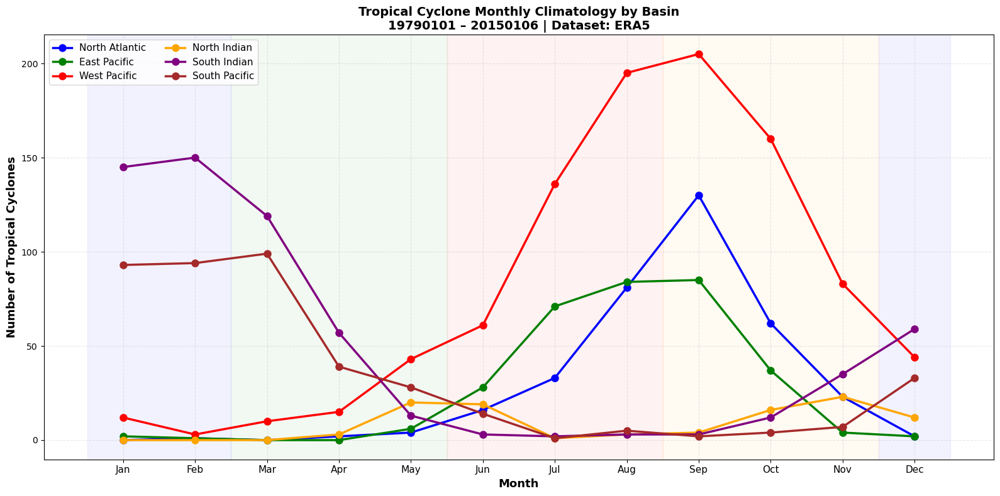


PICCHI MENSILI PER BACINO
North Atlantic       Peak: September (130 TCs)
East Pacific         Peak: September (85 TCs)
West Pacific         Peak: September (205 TCs)
North Indian         Peak: November (23 TCs)
South Indian         Peak: February (150 TCs)
South Pacific        Peak: March (99 TCs)


In [23]:
# ===========================================
# CLIMATOLOGIA MENSILE PER BACINO (avanzata) - CORRETTA
# ===========================================
import calendar

# Funzione bacini (se non già definita)
def get_basin_ibtracs(lon, lat):
    """Classificazione basata su IBTrACS (WMO standard)"""
    lon_360 = lon if lon >= 0 else lon + 360
    
    if (260 <= lon_360 <= 360 or 0 <= lon_360 <= 0) and 0 <= lat <= 70:
        return 'North Atlantic'
    if 180 <= lon_360 < 260 and 0 <= lat <= 60:
        return 'East Pacific'
    if 100 <= lon_360 < 180 and 0 <= lat <= 60:
        return 'West Pacific'
    if 30 <= lon_360 < 100 and 0 <= lat <= 40:
        return 'North Indian'
    if 20 <= lon_360 < 135 and -40 <= lat < 0:
        return 'South Indian'
    if (135 <= lon_360 <= 360 or 0 <= lon_360 < 240) and -40 <= lat < 0:
        return 'South Pacific'
    if (290 <= lon_360 <= 360 or 0 <= lon_360 <= 20) and -40 <= lat < 0:
        return 'South Atlantic'
    return 'Other'

# Bacini principali da analizzare
basins_to_plot = ['North Atlantic', 'East Pacific', 'West Pacific', 
                  'North Indian', 'South Indian', 'South Pacific']

# Conta TCs per mese e bacino
basin_monthly = {basin: {m: set() for m in range(1, 13)} for basin in basins_to_plot}

with open(filtered_file, 'r') as f:
    current_storm = None
    storm_basin = None
    storm_months = set()
    
    for line in f:
        if 'track_id' in line:
            continue
        
        parts = line.strip().split()
        if len(parts) != 12:
            continue
        
        storm_id = parts[0]
        month = int(parts[2])
        lon = float(parts[7])
        lat = float(parts[8])
        
        # Nuovo storm
        if storm_id != current_storm:
            # Salva il precedente
            if current_storm and storm_basin:
                for m in storm_months:
                    basin_monthly[storm_basin][m].add(current_storm)
            
            current_storm = storm_id
            storm_months = set()
            
            # Determina bacino per nuovo storm (usando primo punto)
            storm_basin = get_basin_ibtracs(lon, lat)
            if storm_basin not in basins_to_plot:
                storm_basin = None
        
        if storm_basin:
            storm_months.add(month)
    
    # Ultimo storm
    if current_storm and storm_basin:
        for m in storm_months:
            basin_monthly[storm_basin][m].add(current_storm)

# ===========================================
# PLOT multi-basin
# ===========================================
fig, ax = plt.subplots(figsize=(16, 8))

months = np.arange(1, 13)
month_names = [calendar.month_abbr[m] for m in months]

# Colori per bacini
basin_colors = {
    'North Atlantic': 'blue',
    'East Pacific': 'green',
    'West Pacific': 'red',
    'North Indian': 'orange',
    'South Indian': 'purple',
    'South Pacific': 'brown'
}

# Plot linee per ogni bacino
for basin in basins_to_plot:
    counts = [len(basin_monthly[basin][m]) for m in range(1, 13)]
    ax.plot(months, counts, marker='o', linewidth=2.5, markersize=8,
           label=basin, color=basin_colors[basin])

ax.set_xlabel('Month', fontsize=13, fontweight='bold')
ax.set_ylabel('Number of Tropical Cyclones', fontsize=13, fontweight='bold')
ax.set_title(f'Tropical Cyclone Monthly Climatology by Basin\n'
             f'{startdate} – {enddate} | Dataset: {config["dataset"]["model"]}',
             fontsize=14, fontweight='bold')

ax.set_xticks(months)
ax.set_xticklabels(month_names, fontsize=11)
ax.legend(fontsize=11, loc='upper left', ncol=2)
ax.grid(alpha=0.3, linestyle='--')

# Sfondo stagionale
ax.axvspan(0.5, 2.5, alpha=0.05, color='blue')
ax.axvspan(2.5, 5.5, alpha=0.05, color='green')
ax.axvspan(5.5, 8.5, alpha=0.05, color='red')
ax.axvspan(8.5, 11.5, alpha=0.05, color='orange')
ax.axvspan(11.5, 12.5, alpha=0.05, color='blue')

plt.tight_layout()
plt.savefig(os.path.join(plotdir,
            f'tc_monthly_basins_{config["dataset"]["model"]}_{config["dataset"]["exp"]}_{startdate}_{enddate}.pdf'),
            dpi=300, bbox_inches='tight')
plt.show()

# Statistiche per bacino
print("\n" + "="*70)
print("PICCHI MENSILI PER BACINO")
print("="*70)
for basin in basins_to_plot:
    counts = [len(basin_monthly[basin][m]) for m in range(1, 13)]
    if max(counts) > 0:
        peak_month = counts.index(max(counts)) + 1
        print(f"{basin:<20} Peak: {calendar.month_name[peak_month]} ({max(counts)} TCs)")

✓ Dati già in memoria: 54515 punti


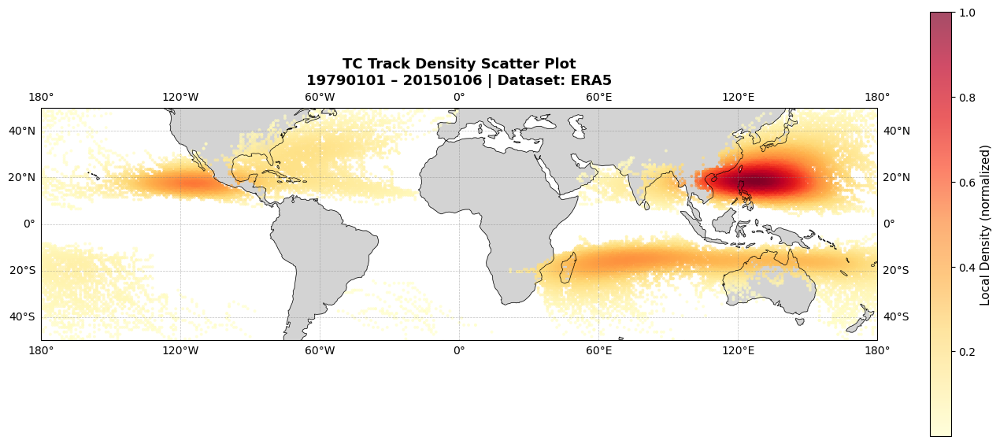

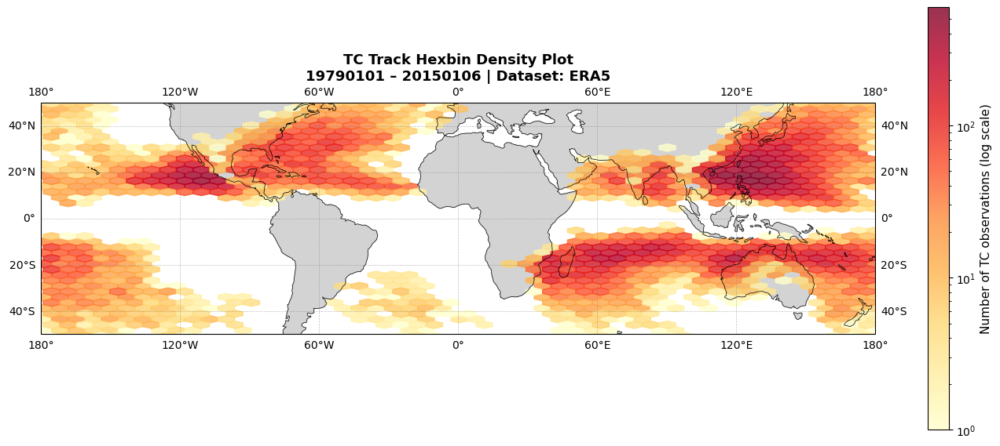

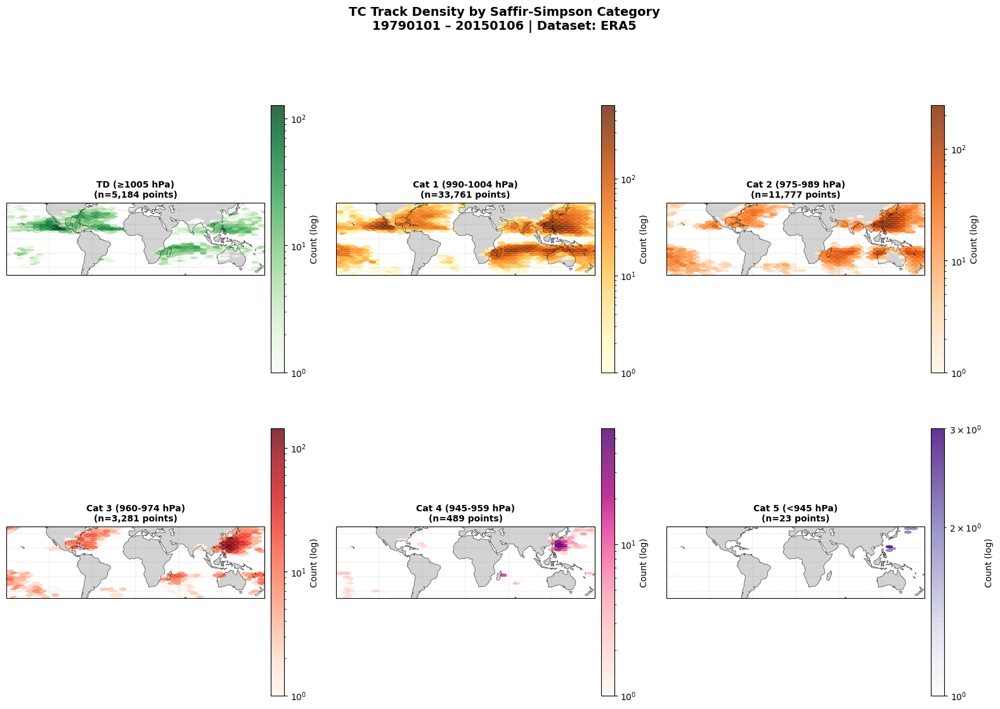

In [24]:
# ===========================================
# DENSITY SCATTER PLOTS - ANALISI STATISTICA SPAZIALE
# ===========================================
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from scipy.stats import gaussian_kde

# ===========================================
# 0. CARICA DATI (se non già caricati)
# ===========================================
if 'points_data' not in globals():
    print("Caricamento dati in corso...")
    points_data = {
        'lon': [],
        'lat': [],
        'slp': [],
        'category': [],
        'storm_id': []
    }

    with open(filtered_file, 'r') as f:
        for line in f:
            if 'track_id' in line or 'year' in line:
                continue
            
            parts = line.strip().split()
            if len(parts) != 12:
                continue
            
            storm_id = parts[0]
            lon = float(parts[7])
            lat = float(parts[8])
            slp_pa = float(parts[9])
            
            category = category_from_slp_pa(slp_pa)
            
            points_data['storm_id'].append(storm_id)
            points_data['lon'].append(lon)
            points_data['lat'].append(lat)
            points_data['slp'].append(slp_pa / 100.0)
            points_data['category'].append(category)

    # Converti in array numpy
    for key in points_data:
        points_data[key] = np.array(points_data[key])
    
    print(f"✓ Dati caricati: {len(points_data['lon'])} punti")
else:
    print(f"✓ Dati già in memoria: {len(points_data['lon'])} punti")

# ===========================================
# 1. DENSITY SCATTER - Colore indica densità locale
# ===========================================
fig = plt.figure(figsize=(14, 8))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([-180, 180, -50, 50], crs=ccrs.PlateCarree())

# Calcola densità locale per ogni punto usando KDE
lon = points_data['lon']
lat = points_data['lat']

# Converti lon da [0,360] a [-180,180] per visualizzazione corretta
lon_plot = np.where(lon > 180, lon - 360, lon)

# Campiona per performance (se troppi punti)
if len(lon) > 50000:
    indices = np.random.choice(len(lon), 50000, replace=False)
    lon_sample = lon_plot[indices]
    lat_sample = lat[indices]
else:
    lon_sample = lon_plot
    lat_sample = lat

# KDE per calcolare densità
try:
    xy = np.vstack([lon_sample, lat_sample])
    kde = gaussian_kde(xy)
    density = kde(xy)
    
    # Normalizza per visualizzazione
    density = density / density.max()
    
    # Plot con colore basato su densità
    scatter = ax.scatter(lon_sample, lat_sample, c=density, 
                        s=8, alpha=0.7, cmap='YlOrRd',
                        transform=ccrs.PlateCarree(),
                        edgecolors='none')
    
    cbar = plt.colorbar(scatter, ax=ax, shrink=0.7, pad=0.05)
    cbar.set_label('Local Density (normalized)', fontsize=11)
    
except Exception as e:
    print(f"KDE failed, using simple scatter: {e}")
    scatter = ax.scatter(lon_sample, lat_sample, 
                        s=5, alpha=0.5, color='blue',
                        transform=ccrs.PlateCarree())

ax.add_feature(cfeature.LAND, color='lightgray', zorder=0)
ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')

plt.title(f'TC Track Density Scatter Plot\n'
          f'{startdate} – {enddate} | Dataset: {config["dataset"]["model"]}',
          fontsize=13, fontweight='bold')

plt.tight_layout()
plt.savefig(os.path.join(plotdir, 
            f'tc_density_scatter_{config["dataset"]["model"]}_{config["dataset"]["exp"]}_{startdate}_{enddate}.pdf'),
            dpi=300, bbox_inches='tight')
plt.show()

# ===========================================
# 2. HEXBIN PLOT - Celle esagonali (migliore per grandi dataset)
# ===========================================
fig = plt.figure(figsize=(14, 8))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([-180, 180, -50, 50], crs=ccrs.PlateCarree())

# Converti lon per plot
lon_plot = np.where(points_data['lon'] > 180, points_data['lon'] - 360, points_data['lon'])

# Hexbin (più efficiente di scatter per molti punti)
hexbin = ax.hexbin(lon_plot, points_data['lat'], 
                   gridsize=50, cmap='YlOrRd', 
                   mincnt=1, bins='log',
                   transform=ccrs.PlateCarree(),
                   alpha=0.8)

cbar = plt.colorbar(hexbin, ax=ax, shrink=0.7, pad=0.05)
cbar.set_label('Number of TC observations (log scale)', fontsize=11)

ax.add_feature(cfeature.LAND, color='lightgray', zorder=0)
ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')

plt.title(f'TC Track Hexbin Density Plot\n'
          f'{startdate} – {enddate} | Dataset: {config["dataset"]["model"]}',
          fontsize=13, fontweight='bold')

plt.tight_layout()
plt.savefig(os.path.join(plotdir, 
            f'tc_hexbin_density_{config["dataset"]["model"]}_{config["dataset"]["exp"]}_{startdate}_{enddate}.pdf'),
            dpi=300, bbox_inches='tight')
plt.show()

# ===========================================
# 3. DENSITY SCATTER PER CATEGORIA - 6 subplot
# ===========================================
fig = plt.figure(figsize=(16, 12))

colors_map = ['Greens', 'YlOrBr', 'Oranges', 'Reds', 'RdPu', 'Purples']
cat_names = ['TD (≥1005 hPa)', 'Cat 1 (990-1004 hPa)', 'Cat 2 (975-989 hPa)', 
             'Cat 3 (960-974 hPa)', 'Cat 4 (945-959 hPa)', 'Cat 5 (<945 hPa)']

for cat in range(6):
    ax = plt.subplot(2, 3, cat+1, projection=ccrs.PlateCarree())
    ax.set_extent([-180, 180, -50, 50], crs=ccrs.PlateCarree())
    
    mask = points_data['category'] == cat
    n_points = mask.sum()
    
    if n_points > 0:
        lon_cat = points_data['lon'][mask]
        lat_cat = points_data['lat'][mask]
        
        # Converti lon
        lon_cat_plot = np.where(lon_cat > 180, lon_cat - 360, lon_cat)
        
        # Hexbin per categoria
        hexbin = ax.hexbin(lon_cat_plot, lat_cat, 
                          gridsize=40, cmap=colors_map[cat],
                          mincnt=1, bins='log',
                          transform=ccrs.PlateCarree(),
                          alpha=0.8)
        
        plt.colorbar(hexbin, ax=ax, shrink=0.7, pad=0.02, 
                    label='Count (log)')
    
    ax.add_feature(cfeature.LAND, color='lightgray', zorder=0)
    ax.add_feature(cfeature.COASTLINE, linewidth=0.3)
    ax.gridlines(linewidth=0.3, color='gray', alpha=0.5, linestyle='--')
    
    ax.set_title(f'{cat_names[cat]}\n(n={n_points:,} points)', 
                fontsize=10, fontweight='bold')

plt.suptitle(f'TC Track Density by Saffir-Simpson Category\n'
             f'{startdate} – {enddate} | Dataset: {config["dataset"]["model"]}',
             fontsize=14, fontweight='bold', y=0.995)

plt.tight_layout()
plt.savefig(os.path.join(plotdir, 
            f'tc_density_by_category_{config["dataset"]["model"]}_{config["dataset"]["exp"]}_{startdate}_{enddate}.pdf'),
            dpi=300, bbox_inches='tight')
plt.show()

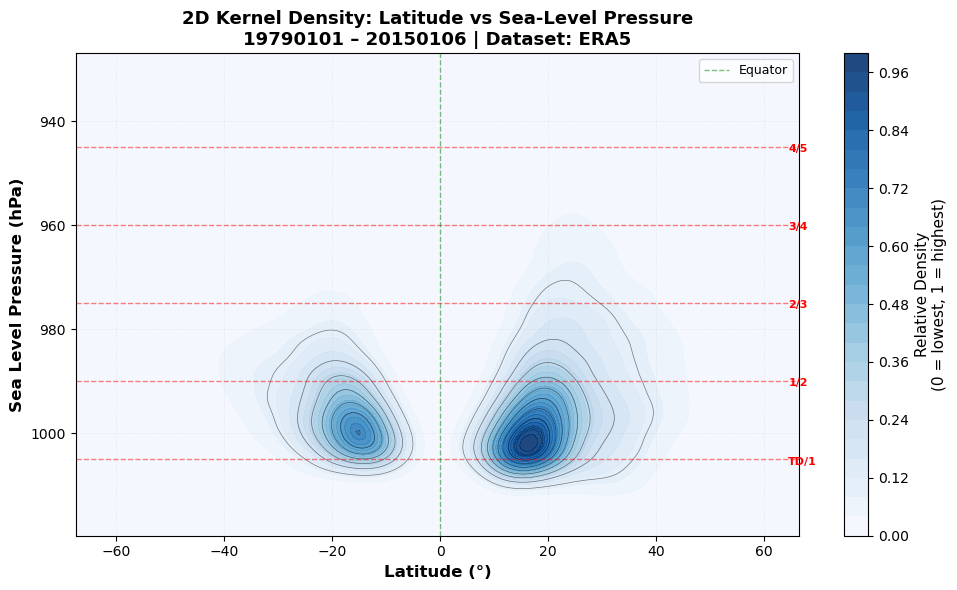


📊 Interpretazione colorbar:
  • 0.0 = Densità minima (quasi nessun TC in quella combinazione lat/SLP)
  • 1.0 = Densità massima (molti TC in quella combinazione)
  • Valori intermedi = densità proporzionale

🎯 Dove cercare il picco:
  • La zona più blu scuro indica la combinazione lat/SLP più comune
  • Probabilmente vedrai: ~10-20°N con SLP ~985-995 hPa


In [27]:
# ===========================================
# KDE 2D: Lat vs SLP 
# ===========================================
from scipy.stats import gaussian_kde

lat = points_data['lat']
slp = points_data['slp']

# KDE
values = np.vstack([lat, slp])
kde = gaussian_kde(values)

lat_grid = np.linspace(lat.min(), lat.max(), 200)
slp_grid = np.linspace(slp.min(), slp.max(), 200)
LAT, SLP = np.meshgrid(lat_grid, slp_grid)

positions = np.vstack([LAT.ravel(), SLP.ravel()])
density = kde(positions).reshape(LAT.shape)

# NORMALIZZA la densità tra 0 e 1 per leggibilità
density_normalized = (density - density.min()) / (density.max() - density.min())

fig, ax = plt.subplots(figsize=(10, 6))

# WHITE background
ax.set_facecolor('white')
fig.patch.set_facecolor('white')

# Filled contour con densità normalizzata
contour = ax.contourf(
    LAT, SLP, density_normalized,  # <-- Usa densità normalizzata
    levels=30,
    cmap='Blues',
    alpha=0.9
)

# Contour lines
ax.contour(
    LAT, SLP, density_normalized,
    levels=10,
    colors='black',
    linewidths=0.5,
    alpha=0.5
)

# Colorbar con label più chiara
cbar = plt.colorbar(contour, ax=ax)
cbar.set_label('Relative Density\n(0 = lowest, 1 = highest)', fontsize=11)

# Inverti Y per convenzione meteo
ax.invert_yaxis()

ax.set_xlabel('Latitude (°)', fontsize=12, fontweight='bold')
ax.set_ylabel('Sea Level Pressure (hPa)', fontsize=12, fontweight='bold')
ax.set_title(f'2D Kernel Density: Latitude vs Sea-Level Pressure\n'
             f'{startdate} – {enddate} | Dataset: {config["dataset"]["model"]}',
             fontsize=13, fontweight='bold')

# Grid
ax.grid(alpha=0.2, linestyle=':', linewidth=0.5, color='gray')

# Linee di riferimento categorie
category_lines = [1005, 990, 975, 960, 945]
cat_names_short = ['TD/1', '1/2', '2/3', '3/4', '4/5']
for i, press in enumerate(category_lines):
    if slp.min() <= press <= slp.max():
        ax.axhline(press, color='red', linestyle='--', linewidth=1, alpha=0.5)
        ax.text(lat.max() - 2, press + 1, cat_names_short[i], 
               fontsize=8, color='red', fontweight='bold')

# Equatore
ax.axvline(0, color='green', linestyle='--', linewidth=1, alpha=0.5, label='Equator')

ax.legend(fontsize=9, loc='upper right')

plt.tight_layout()
plt.savefig(os.path.join(plotdir,
            f'tc_kde2d_lat_slp_{config["dataset"]["model"]}_{config["dataset"]["exp"]}_{startdate}_{enddate}.pdf'),
            dpi=300, bbox_inches='tight')
plt.show()

print(f"\n📊 Interpretazione colorbar:")
print(f"  • 0.0 = Densità minima (quasi nessun TC in quella combinazione lat/SLP)")
print(f"  • 1.0 = Densità massima (molti TC in quella combinazione)")
print(f"  • Valori intermedi = densità proporzionale")
print(f"\n🎯 Dove cercare il picco:")
print(f"  • La zona più blu scuro indica la combinazione lat/SLP più comune")
print(f"  • Probabilmente vedrai: ~10-20°N con SLP ~985-995 hPa")

Numero cicloni analizzati: 2349


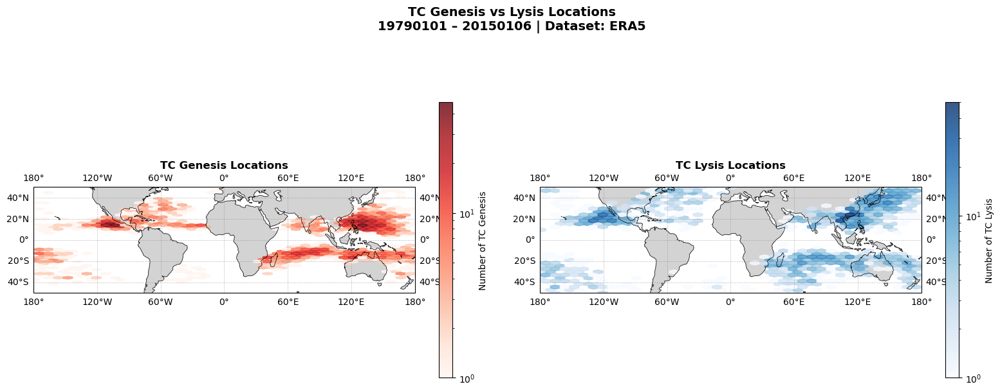


STATISTICHE GENESIS vs LYSIS
Metrica                        Genesis              Lysis               
----------------------------------------------------------------------
Latitudine media                             4.93°               8.80°
SLP medio (hPa)                            1002.1              997.1
% emisfero nord                             63.9%              63.9%


In [25]:
# ===========================================
# GENESIS vs LYSIS ANALYSIS
# ===========================================
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Identifica primo e ultimo punto di ogni ciclone
genesis_points = {'lon': [], 'lat': [], 'category': [], 'slp': []}
lysis_points = {'lon': [], 'lat': [], 'category': [], 'slp': []}

with open(filtered_file, 'r') as f:
    current_storm = None
    storm_data = []
    
    for line in f:
        if 'track_id' in line:
            continue
        
        parts = line.strip().split()
        if len(parts) != 12:
            continue
        
        storm_id = parts[0]
        
        # Nuovo storm - salva il precedente
        if storm_id != current_storm:
            if storm_data:
                # Genesis (primo punto)
                genesis_points['lon'].append(storm_data[0][0])
                genesis_points['lat'].append(storm_data[0][1])
                genesis_points['category'].append(storm_data[0][2])
                genesis_points['slp'].append(storm_data[0][3])
                
                # Lysis (ultimo punto)
                lysis_points['lon'].append(storm_data[-1][0])
                lysis_points['lat'].append(storm_data[-1][1])
                lysis_points['category'].append(storm_data[-1][2])
                lysis_points['slp'].append(storm_data[-1][3])
            
            current_storm = storm_id
            storm_data = []
        
        lon = float(parts[7])
        lat = float(parts[8])
        slp = float(parts[9]) / 100.0
        cat = category_from_slp_pa(float(parts[9]))
        
        storm_data.append([lon, lat, cat, slp])
    
    # Ultimo storm
    if storm_data:
        genesis_points['lon'].append(storm_data[0][0])
        genesis_points['lat'].append(storm_data[0][1])
        genesis_points['category'].append(storm_data[0][2])
        genesis_points['slp'].append(storm_data[0][3])
        
        lysis_points['lon'].append(storm_data[-1][0])
        lysis_points['lat'].append(storm_data[-1][1])
        lysis_points['category'].append(storm_data[-1][2])
        lysis_points['slp'].append(storm_data[-1][3])

# Converti in array
for key in genesis_points:
    genesis_points[key] = np.array(genesis_points[key])
    lysis_points[key] = np.array(lysis_points[key])

print(f"Numero cicloni analizzati: {len(genesis_points['lon'])}")

# ===========================================
# PLOT: Genesis vs Lysis
# ===========================================
fig = plt.figure(figsize=(16, 7))

# Subplot 1: Genesis locations
ax1 = plt.subplot(1, 2, 1, projection=ccrs.PlateCarree())
ax1.set_extent([-180, 180, -50, 50], crs=ccrs.PlateCarree())

lon_genesis = np.where(genesis_points['lon'] > 180, genesis_points['lon'] - 360, genesis_points['lon'])

hexbin1 = ax1.hexbin(lon_genesis, genesis_points['lat'],
                     gridsize=40, cmap='Reds', mincnt=1, bins='log',
                     transform=ccrs.PlateCarree(), alpha=0.8)

ax1.add_feature(cfeature.LAND, color='lightgray', zorder=0)
ax1.add_feature(cfeature.COASTLINE, linewidth=0.5)
ax1.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
plt.colorbar(hexbin1, ax=ax1, label='Number of TC Genesis', shrink=0.7)
ax1.set_title('TC Genesis Locations', fontsize=12, fontweight='bold')

# Subplot 2: Lysis locations
ax2 = plt.subplot(1, 2, 2, projection=ccrs.PlateCarree())
ax2.set_extent([-180, 180, -50, 50], crs=ccrs.PlateCarree())

lon_lysis = np.where(lysis_points['lon'] > 180, lysis_points['lon'] - 360, lysis_points['lon'])

hexbin2 = ax2.hexbin(lon_lysis, lysis_points['lat'],
                     gridsize=40, cmap='Blues', mincnt=1, bins='log',
                     transform=ccrs.PlateCarree(), alpha=0.8)

ax2.add_feature(cfeature.LAND, color='lightgray', zorder=0)
ax2.add_feature(cfeature.COASTLINE, linewidth=0.5)
ax2.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
plt.colorbar(hexbin2, ax=ax2, label='Number of TC Lysis', shrink=0.7)
ax2.set_title('TC Lysis Locations', fontsize=12, fontweight='bold')

plt.suptitle(f'TC Genesis vs Lysis Locations\n'
             f'{startdate} – {enddate} | Dataset: {config["dataset"]["model"]}',
             fontsize=14, fontweight='bold')

plt.tight_layout()
plt.savefig(os.path.join(plotdir,
            f'tc_genesis_lysis_{config["dataset"]["model"]}_{config["dataset"]["exp"]}_{startdate}_{enddate}.pdf'),
            dpi=300, bbox_inches='tight')
plt.show()

# Statistiche
print("\n" + "="*70)
print("STATISTICHE GENESIS vs LYSIS")
print("="*70)
print(f"{'Metrica':<30} {'Genesis':<20} {'Lysis':<20}")
print("-"*70)
print(f"{'Latitudine media':<30} {genesis_points['lat'].mean():>18.2f}° {lysis_points['lat'].mean():>18.2f}°")
print(f"{'SLP medio (hPa)':<30} {genesis_points['slp'].mean():>18.1f} {lysis_points['slp'].mean():>18.1f}")
print(f"{'% emisfero nord':<30} {(genesis_points['lat']>0).sum()/len(genesis_points['lat'])*100:>17.1f}% "
      f"{(lysis_points['lat']>0).sum()/len(lysis_points['lat'])*100:>17.1f}%")

Totale osservazioni con mese: 54515


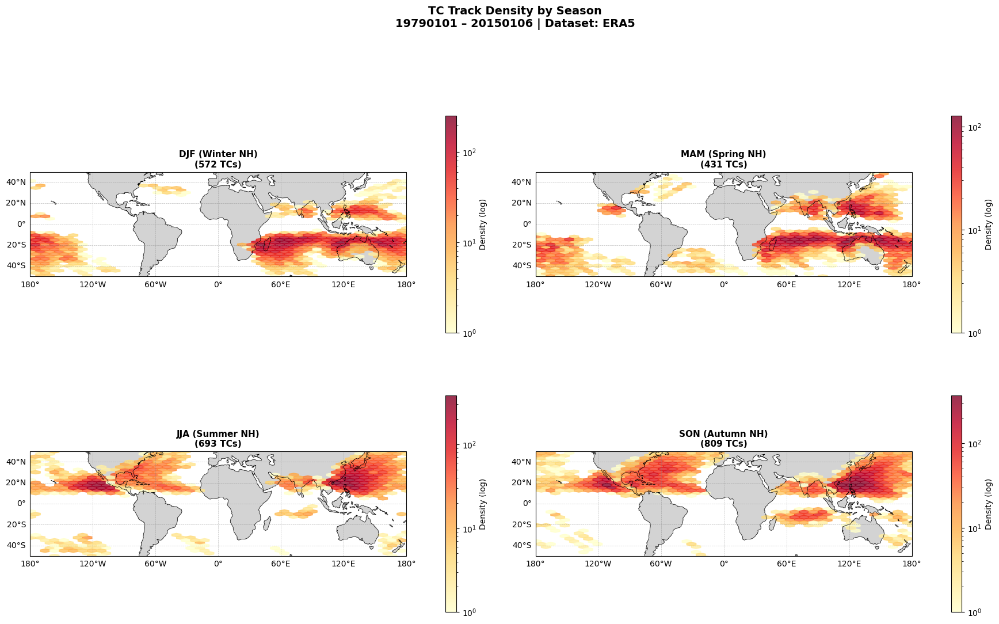

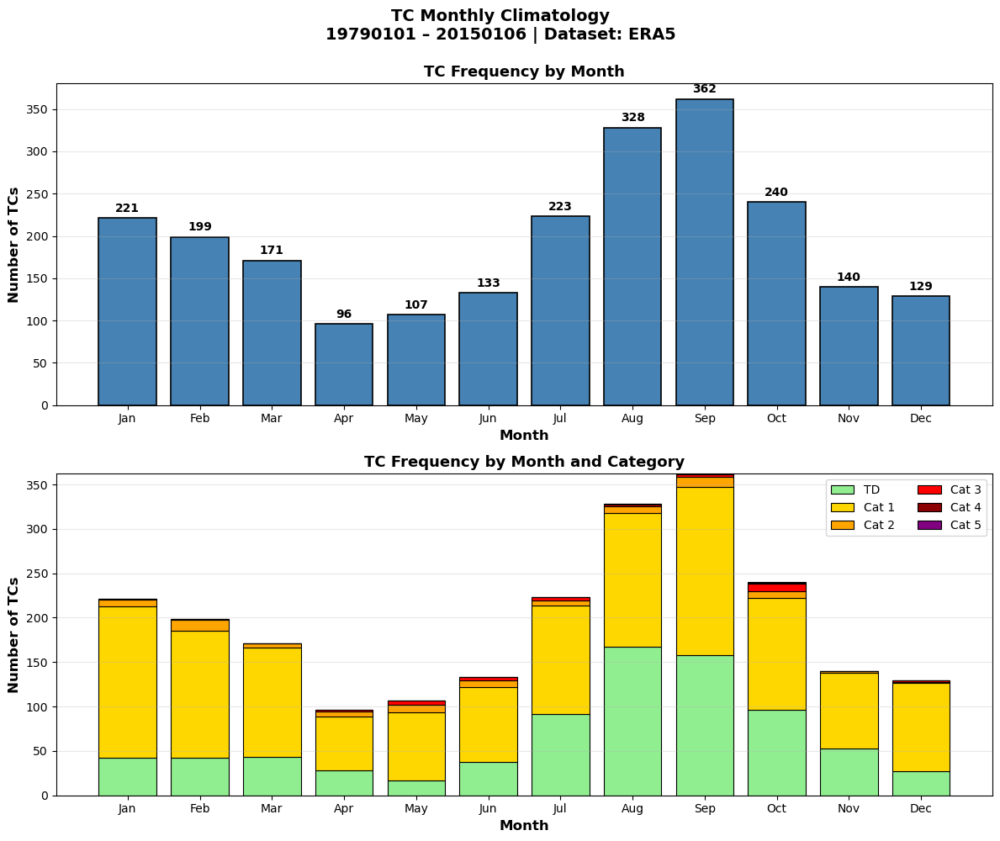


STATISTICHE MENSILI
Mese         N TCs      % anno     Cat media    SLP medio (hPa)
--------------------------------------------------------------------------------
January      221             9.4%       0.85              994.5
February     199             8.5%       0.86              992.9
March        171             7.3%       0.78              994.6
April        96              4.1%       0.80              995.6
May          107             4.6%       1.02              994.0
June         133             5.7%       0.83              994.8
July         223             9.5%       0.65              995.0
August       328            14.0%       0.53              993.9
September    362            15.4%       0.62              992.6
October      240            10.2%       0.73              991.7
November     140             6.0%       0.64              995.1
December     129             5.5%       0.81              995.1

TOTALE       2349      

🌀 Mese di picco: September (362 TCs)
📊 J

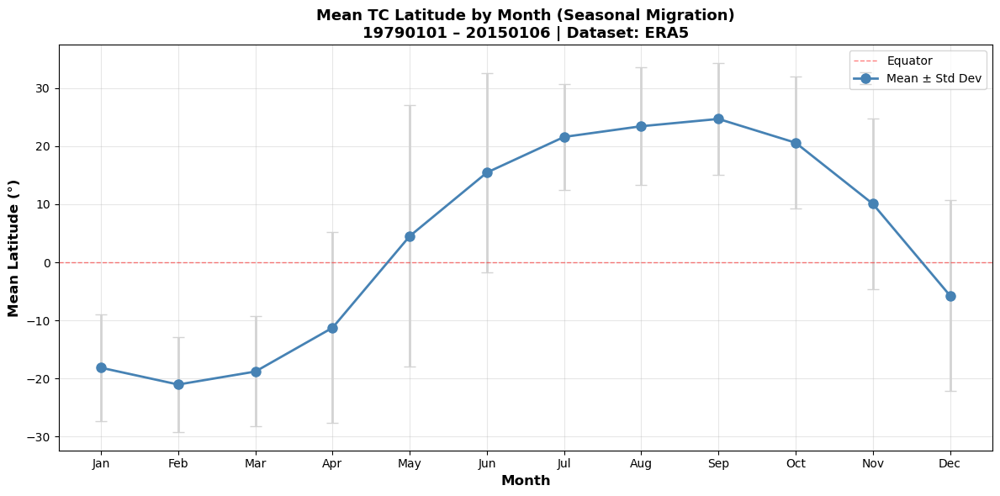

In [26]:
# ===========================================
# ANALISI STAGIONALE DEI CICLONI TROPICALI
# ===========================================
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import calendar

# ===========================================
# 1. CARICA DATI CON INFORMAZIONE MESE
# ===========================================
seasonal_data = {
    'lon': [], 'lat': [], 'month': [], 'category': [], 
    'slp': [], 'storm_id': []
}

with open(filtered_file, 'r') as f:
    for line in f:
        if 'track_id' in line or 'year' in line:
            continue
        
        parts = line.strip().split()
        if len(parts) != 12:
            continue
        
        storm_id = parts[0]
        month = int(parts[2])
        lon = float(parts[7])
        lat = float(parts[8])
        slp_pa = float(parts[9])
        cat = category_from_slp_pa(slp_pa)
        
        seasonal_data['storm_id'].append(storm_id)
        seasonal_data['month'].append(month)
        seasonal_data['lon'].append(lon)
        seasonal_data['lat'].append(lat)
        seasonal_data['slp'].append(slp_pa / 100.0)
        seasonal_data['category'].append(cat)

# Converti in array
for key in seasonal_data:
    seasonal_data[key] = np.array(seasonal_data[key])

print(f"Totale osservazioni con mese: {len(seasonal_data['month'])}")

# ===========================================
# 2. MAPPE STAGIONALI (4 subplot) - CORRETTE
# ===========================================
seasons = {
    'DJF (Winter NH)': [12, 1, 2],
    'MAM (Spring NH)': [3, 4, 5],
    'JJA (Summer NH)': [6, 7, 8],
    'SON (Autumn NH)': [9, 10, 11]
}

fig = plt.figure(figsize=(18, 12))  # Aumentata larghezza

for idx, (season_name, months) in enumerate(seasons.items(), 1):
    ax = plt.subplot(2, 2, idx, projection=ccrs.PlateCarree())
    ax.set_extent([-180, 180, -50, 50], crs=ccrs.PlateCarree())
    
    # Filtra dati per stagione
    mask = np.isin(seasonal_data['month'], months)
    
    # Conta TCs unici (non punti totali)
    storms_in_season = set()
    for i in np.where(mask)[0]:
        storms_in_season.add(seasonal_data['storm_id'][i])
    n_tcs = len(storms_in_season)
    
    if mask.sum() > 0:
        lon_season = seasonal_data['lon'][mask]
        lat_season = seasonal_data['lat'][mask]
        
        # Converti lon
        lon_plot = np.where(lon_season > 180, lon_season - 360, lon_season)
        
        # Hexbin
        hexbin = ax.hexbin(lon_plot, lat_season,
                          gridsize=40, cmap='YlOrRd',
                          mincnt=1, bins='log',
                          transform=ccrs.PlateCarree(),
                          alpha=0.8)
        
        # Colorbar con più spazio
        plt.colorbar(hexbin, ax=ax, shrink=0.6, pad=0.08,  # Aumentato pad da 0.02 a 0.08
                    label='Density (log)')
    
    ax.add_feature(cfeature.LAND, color='lightgray', zorder=0)
    ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
    
    # Gridlines con label solo a sinistra e in basso
    gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', 
                     alpha=0.5, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False  # Rimuove label a destra (dove c'è la colorbar)
    
    # Mostra numero di TCs unici
    ax.set_title(f'{season_name}\n({n_tcs} TCs)', 
                fontsize=11, fontweight='bold')

plt.suptitle(f'TC Track Density by Season\n'
             f'{startdate} – {enddate} | Dataset: {config["dataset"]["model"]}',
             fontsize=14, fontweight='bold', y=0.995)

plt.tight_layout()
plt.savefig(os.path.join(plotdir,
            f'tc_seasonal_maps_{config["dataset"]["model"]}_{config["dataset"]["exp"]}_{startdate}_{enddate}.pdf'),
            dpi=300, bbox_inches='tight')
plt.show()
# ===========================================
# 3. FREQUENZA MENSILE E CATEGORIE
# ===========================================
# Conta cicloni unici per mese (usa primo timestep di ogni storm)
monthly_storms = {month: set() for month in range(1, 13)}
monthly_categories = {month: [] for month in range(1, 13)}

with open(filtered_file, 'r') as f:
    current_storm = None
    
    for line in f:
        if 'track_id' in line:
            continue
        
        parts = line.strip().split()
        if len(parts) != 12:
            continue
        
        storm_id = parts[0]
        month = int(parts[2])
        cat = category_from_slp_pa(float(parts[9]))
        
        # Primo timestep di ogni storm
        if storm_id != current_storm:
            monthly_storms[month].add(storm_id)
            monthly_categories[month].append(cat)
            current_storm = storm_id

# Converti set in count
monthly_counts = {month: len(storms) for month, storms in monthly_storms.items()}


# ===========================================
# 4. PLOT: Frequenza mensile con stacked bar per categoria
# ===========================================
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10))

# --- Subplot 1: Frequenza totale per mese ---
months = list(range(1, 13))
counts = [monthly_counts[m] for m in months]
month_names = [calendar.month_abbr[m] for m in months]

ax1.bar(months, counts, color='steelblue', edgecolor='black', linewidth=1.2)
ax1.set_xlabel('Month', fontsize=12, fontweight='bold')
ax1.set_ylabel('Number of TCs', fontsize=12, fontweight='bold')
ax1.set_title('TC Frequency by Month', fontsize=13, fontweight='bold')
ax1.set_xticks(months)
ax1.set_xticklabels(month_names)
ax1.grid(alpha=0.3, axis='y')

# Aggiungi numeri sopra le barre
for i, (m, c) in enumerate(zip(months, counts)):
    ax1.text(m, c + max(counts)*0.02, str(c), 
            ha='center', fontweight='bold', fontsize=10)

# --- Subplot 2: Stacked bar per categoria ---
# Conta categorie per mese
cat_by_month = np.zeros((6, 12))
for month in range(1, 13):
    cats = monthly_categories[month]
    for cat in cats:
        cat_by_month[cat, month-1] += 1

colors = ['lightgreen', 'gold', 'orange', 'red', 'darkred', 'purple']
cat_names = ['TD', 'Cat 1', 'Cat 2', 'Cat 3', 'Cat 4', 'Cat 5']

bottom = np.zeros(12)
for cat in range(6):
    ax2.bar(months, cat_by_month[cat, :], bottom=bottom,
           label=cat_names[cat], color=colors[cat],
           edgecolor='black', linewidth=0.8)
    bottom += cat_by_month[cat, :]

ax2.set_xlabel('Month', fontsize=12, fontweight='bold')
ax2.set_ylabel('Number of TCs', fontsize=12, fontweight='bold')
ax2.set_title('TC Frequency by Month and Category', fontsize=13, fontweight='bold')
ax2.set_xticks(months)
ax2.set_xticklabels(month_names)
ax2.legend(fontsize=10, loc='upper right', ncol=2)
ax2.grid(alpha=0.3, axis='y')

plt.suptitle(f'TC Monthly Climatology\n'
             f'{startdate} – {enddate} | Dataset: {config["dataset"]["model"]}',
             fontsize=14, fontweight='bold', y=0.995)

plt.tight_layout()
plt.savefig(os.path.join(plotdir,
            f'tc_monthly_climatology_{config["dataset"]["model"]}_{config["dataset"]["exp"]}_{startdate}_{enddate}.pdf'),
            dpi=300, bbox_inches='tight')
plt.show()

# ===========================================
# 5. STATISTICHE MENSILI
# ===========================================
print("\n" + "="*80)
print("STATISTICHE MENSILI")
print("="*80)
print(f"{'Mese':<12} {'N TCs':<10} {'% anno':<10} {'Cat media':<12} {'SLP medio (hPa)':<15}")
print("-"*80)

total_year = sum(monthly_counts.values())
for month in range(1, 13):
    n_tcs = monthly_counts[month]
    pct = n_tcs / total_year * 100 if total_year > 0 else 0
    
    # Categoria media
    cats = monthly_categories[month]
    avg_cat = np.mean(cats) if cats else 0
    
    # SLP medio per quel mese
    mask = seasonal_data['month'] == month
    if mask.sum() > 0:
        avg_slp = seasonal_data['slp'][mask].mean()
    else:
        avg_slp = 0
    
    print(f"{calendar.month_name[month]:<12} {n_tcs:<10} {pct:>8.1f}% {avg_cat:>10.2f} {avg_slp:>18.1f}")

print(f"\n{'TOTALE':<12} {total_year:<10}")

# Identifica picchi
peak_month = max(monthly_counts, key=monthly_counts.get)
print(f"\n🌀 Mese di picco: {calendar.month_name[peak_month]} ({monthly_counts[peak_month]} TCs)")

# Stagione principale
nh_summer = sum([monthly_counts[m] for m in [6, 7, 8, 9]])
nh_winter = sum([monthly_counts[m] for m in [12, 1, 2, 3]])
print(f"📊 JJA-SON (estate NH): {nh_summer} TCs ({nh_summer/total_year*100:.1f}%)")
print(f"📊 DJF-MAM (inverno NH): {nh_winter} TCs ({nh_winter/total_year*100:.1f}%)")

# ===========================================
# 6. LATITUDINE MEDIA PER MESE
# ===========================================
fig, ax = plt.subplots(figsize=(12, 6))

monthly_lat_mean = []
monthly_lat_std = []
for month in range(1, 13):
    mask = seasonal_data['month'] == month
    if mask.sum() > 0:
        monthly_lat_mean.append(seasonal_data['lat'][mask].mean())
        monthly_lat_std.append(seasonal_data['lat'][mask].std())
    else:
        monthly_lat_mean.append(0)
        monthly_lat_std.append(0)

ax.errorbar(months, monthly_lat_mean, yerr=monthly_lat_std,
           marker='o', markersize=8, linewidth=2, capsize=5,
           color='steelblue', ecolor='lightgray', label='Mean ± Std Dev')

ax.axhline(0, color='red', linestyle='--', linewidth=1, alpha=0.5, label='Equator')
ax.set_xlabel('Month', fontsize=12, fontweight='bold')
ax.set_ylabel('Mean Latitude (°)', fontsize=12, fontweight='bold')
ax.set_title(f'Mean TC Latitude by Month (Seasonal Migration)\n'
             f'{startdate} – {enddate} | Dataset: {config["dataset"]["model"]}',
             fontsize=13, fontweight='bold')
ax.set_xticks(months)
ax.set_xticklabels(month_names)
ax.grid(alpha=0.3)
ax.legend(fontsize=10)

plt.tight_layout()
plt.savefig(os.path.join(plotdir,
            f'tc_seasonal_migration_{config["dataset"]["model"]}_{config["dataset"]["exp"]}_{startdate}_{enddate}.pdf'),
            dpi=300, bbox_inches='tight')
plt.show()

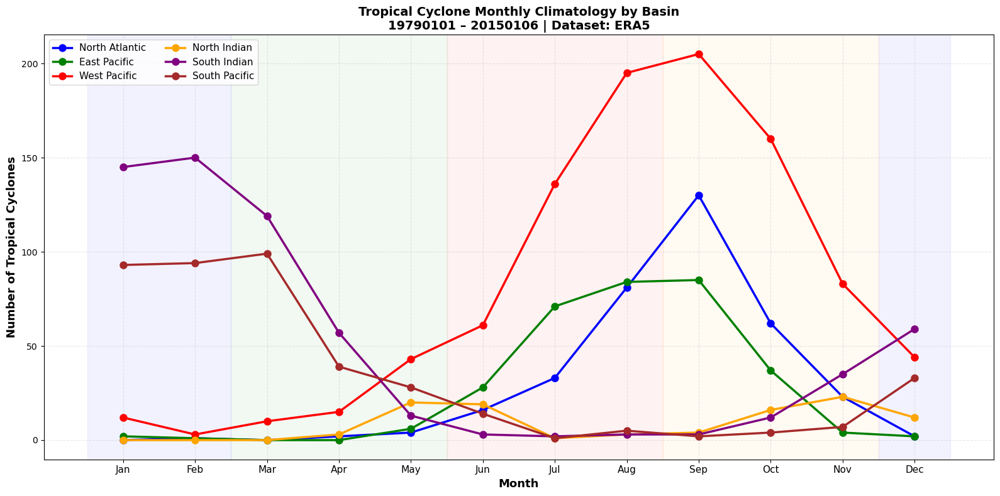


PICCHI MENSILI PER BACINO
North Atlantic       Peak: September (130 TCs)
East Pacific         Peak: September (85 TCs)
West Pacific         Peak: September (205 TCs)
North Indian         Peak: November (23 TCs)
South Indian         Peak: February (150 TCs)
South Pacific        Peak: March (99 TCs)


In [27]:
# ===========================================
# CLIMATOLOGIA MENSILE PER BACINO (avanzata)
# ===========================================

# Bacini principali da analizzare
basins_to_plot = ['North Atlantic', 'East Pacific', 'West Pacific', 
                  'North Indian', 'South Indian', 'South Pacific']

# Conta TCs per mese e bacino
basin_monthly = {basin: {m: set() for m in range(1, 13)} for basin in basins_to_plot}

with open(filtered_file, 'r') as f:
    current_storm = None
    storm_basin = None
    storm_months = set()
    
    for line in f:
        if 'track_id' in line:
            continue
        
        parts = line.strip().split()
        if len(parts) != 12:
            continue
        
        storm_id = parts[0]
        month = int(parts[2])
        lon = float(parts[7])
        lat = float(parts[8])
        
        # Nuovo storm
        if storm_id != current_storm:
            # Salva il precedente
            if current_storm and storm_basin:
                for m in storm_months:
                    basin_monthly[storm_basin][m].add(current_storm)
            
            current_storm = storm_id
            storm_months = set()
            
            # Determina bacino per nuovo storm (usando primo punto)
            storm_basin = get_basin_ibtracs(lon, lat)
            if storm_basin not in basins_to_plot:
                storm_basin = None
        
        if storm_basin:
            storm_months.add(month)
    
    # Ultimo storm
    if current_storm and storm_basin:
        for m in storm_months:
            basin_monthly[storm_basin][m].add(current_storm)

# ===========================================
# PLOT multi-basin
# ===========================================
fig, ax = plt.subplots(figsize=(16, 8))

months = np.arange(1, 13)
month_names = [calendar.month_abbr[m] for m in months]

# Colori per bacini
basin_colors = {
    'North Atlantic': 'blue',
    'East Pacific': 'green',
    'West Pacific': 'red',
    'North Indian': 'orange',
    'South Indian': 'purple',
    'South Pacific': 'brown'
}

# Plot linee per ogni bacino
for basin in basins_to_plot:
    counts = [len(basin_monthly[basin][m]) for m in range(1, 13)]
    ax.plot(months, counts, marker='o', linewidth=2.5, markersize=8,
           label=basin, color=basin_colors[basin])

ax.set_xlabel('Month', fontsize=13, fontweight='bold')
ax.set_ylabel('Number of Tropical Cyclones', fontsize=13, fontweight='bold')
ax.set_title(f'Tropical Cyclone Monthly Climatology by Basin\n'
             f'{startdate} – {enddate} | Dataset: {config["dataset"]["model"]}',
             fontsize=14, fontweight='bold')

ax.set_xticks(months)
ax.set_xticklabels(month_names, fontsize=11)
ax.legend(fontsize=11, loc='upper left', ncol=2)
ax.grid(alpha=0.3, linestyle='--')

# Sfondo stagionale
ax.axvspan(0.5, 2.5, alpha=0.05, color='blue')
ax.axvspan(2.5, 5.5, alpha=0.05, color='green')
ax.axvspan(5.5, 8.5, alpha=0.05, color='red')
ax.axvspan(8.5, 11.5, alpha=0.05, color='orange')
ax.axvspan(11.5, 12.5, alpha=0.05, color='blue')

plt.tight_layout()
plt.savefig(os.path.join(plotdir,
            f'tc_monthly_basins_{config["dataset"]["model"]}_{config["dataset"]["exp"]}_{startdate}_{enddate}.pdf'),
            dpi=300, bbox_inches='tight')
plt.show()

# Statistiche per bacino
print("\n" + "="*70)
print("PICCHI MENSILI PER BACINO")
print("="*70)
for basin in basins_to_plot:
    counts = [len(basin_monthly[basin][m]) for m in range(1, 13)]
    if max(counts) > 0:
        peak_month = counts.index(max(counts)) + 1
        print(f"{basin:<20} Peak: {calendar.month_name[peak_month]} ({max(counts)} TCs)")

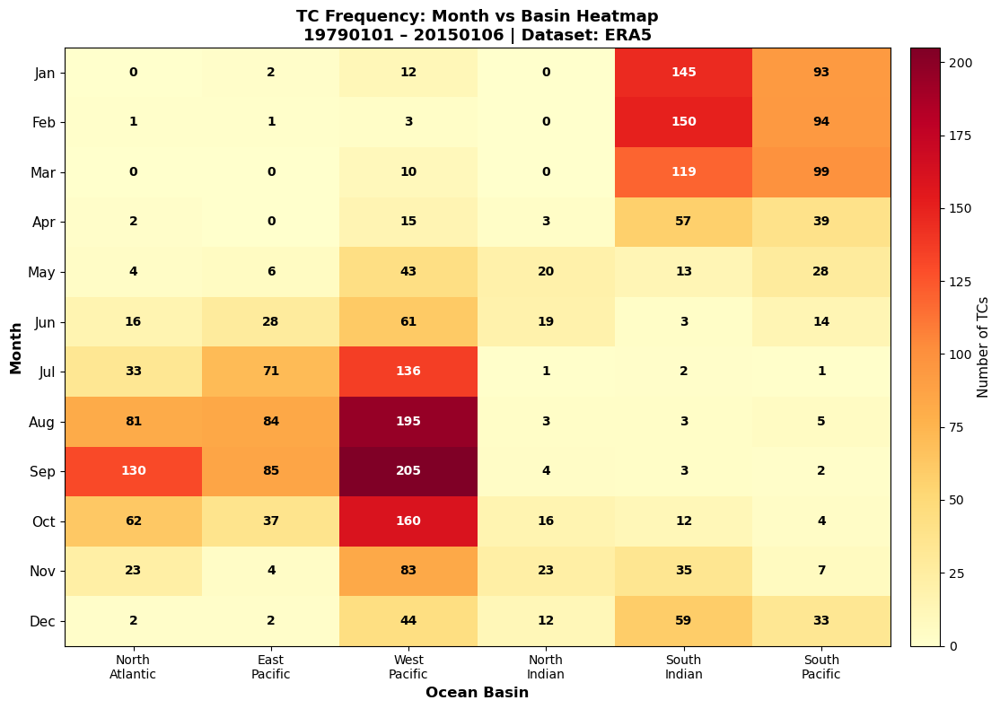


[DEBUG] Matrix range: 0 - 205
[DEBUG] Total TCs in matrix: 2762


In [28]:
# ===========================================
# HEATMAP: Mese vs Bacino 
# ===========================================

# Matrice mese x bacino
matrix = np.zeros((12, len(basins_to_plot)))
for i, basin in enumerate(basins_to_plot):
    for month in range(1, 13):
        matrix[month-1, i] = len(basin_monthly[basin][month])

fig, ax = plt.subplots(figsize=(12, 8))

# Usa vmin=0 e vmax dinamico per evitare tutto arancione
im = ax.imshow(matrix, cmap='YlOrRd', aspect='auto', 
               vmin=0, vmax=matrix.max())  # Range esplicito

# Aggiungi numeri nelle celle
for i in range(12):
    for j in range(len(basins_to_plot)):
        count = int(matrix[i, j])
        # Mostra numero anche se è 0
        color = 'white' if count > matrix.max()/2 else 'black'
        ax.text(j, i, str(count), ha='center', va='center',
               color=color, fontsize=10, fontweight='bold')

ax.set_xticks(np.arange(len(basins_to_plot)))
ax.set_yticks(np.arange(12))
ax.set_xticklabels([b.replace(' ', '\n') for b in basins_to_plot], 
                   fontsize=10, rotation=0)
ax.set_yticklabels([calendar.month_abbr[m] for m in range(1, 13)], fontsize=11)

ax.set_xlabel('Ocean Basin', fontsize=12, fontweight='bold')
ax.set_ylabel('Month', fontsize=12, fontweight='bold')
ax.set_title(f'TC Frequency: Month vs Basin Heatmap\n'
             f'{startdate} – {enddate} | Dataset: {config["dataset"]["model"]}',
             fontsize=13, fontweight='bold')

cbar = plt.colorbar(im, ax=ax, pad=0.02)
cbar.set_label('Number of TCs', fontsize=11)

plt.tight_layout()
plt.savefig(os.path.join(plotdir,
            f'tc_monthly_basin_heatmap_{config["dataset"]["model"]}_{config["dataset"]["exp"]}_{startdate}_{enddate}.pdf'),
            dpi=300, bbox_inches='tight')
plt.show()

# Debug: mostra range valori
print(f"\n[DEBUG] Matrix range: {matrix.min():.0f} - {matrix.max():.0f}")
print(f"[DEBUG] Total TCs in matrix: {matrix.sum():.0f}")


STATISTICHE DURATA CICLONI
Numero totale cicloni: 2349
Durata media: 5.6 giorni
Durata mediana: 4.8 giorni
Durata minima: 2.2 giorni (54 ore)
Durata massima: 20.8 giorni
Deviazione standard: 2.8 giorni


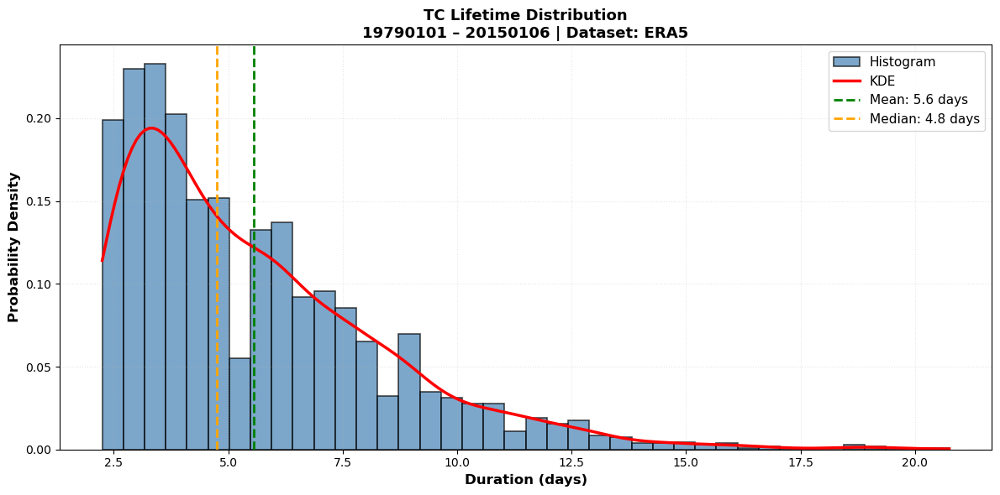

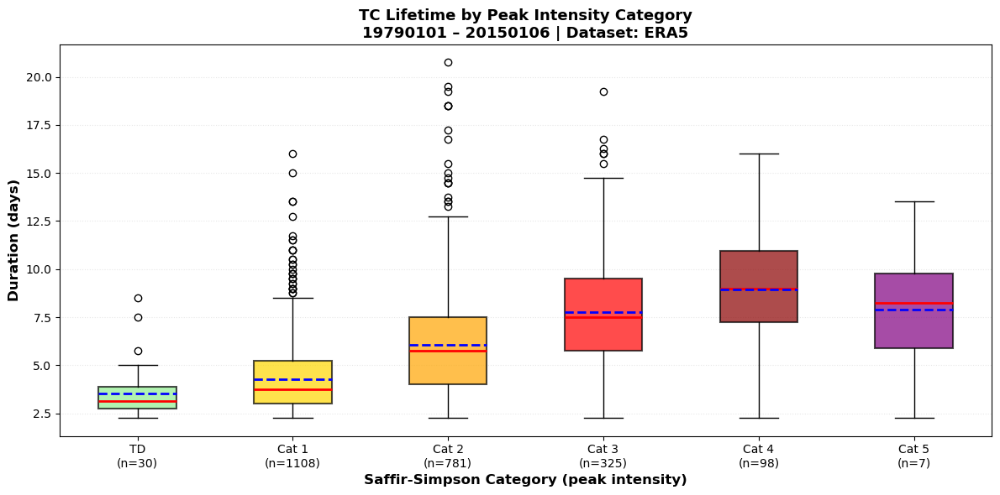

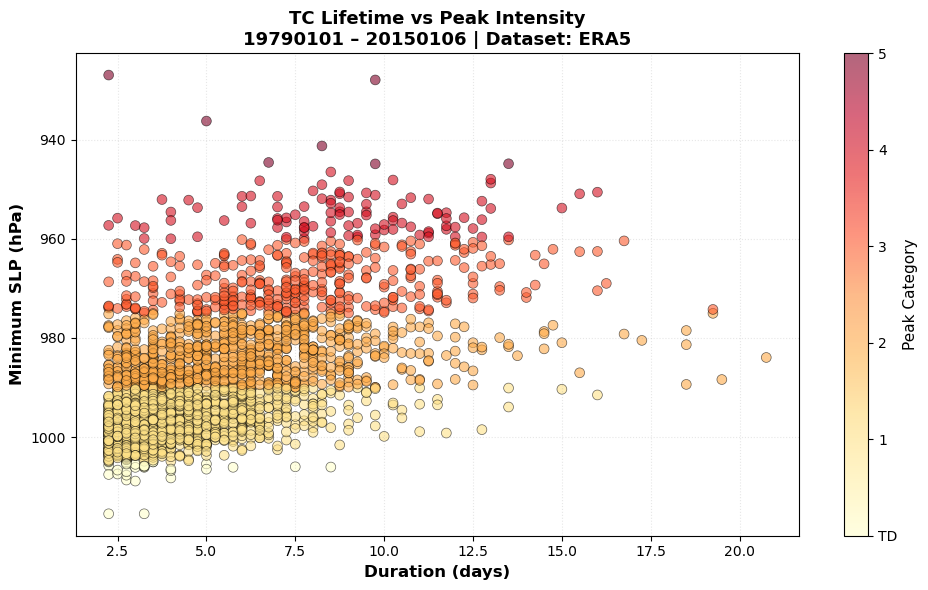


DURATA MEDIA PER CATEGORIA
Categoria       N cicloni    Durata media    Durata max     
----------------------------------------------------------------------
TD              30                     3.5 d           8.5 d
Cat 1           1108                   4.3 d          16.0 d
Cat 2           781                    6.1 d          20.8 d
Cat 3           325                    7.8 d          19.2 d
Cat 4           98                     8.9 d          16.0 d
Cat 5           7                      7.9 d          13.5 d


In [30]:
# ===========================================
# ANALISI DURATA DEI CICLONI TROPICALI
# ===========================================
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
import calendar

# Calcola durata per ogni ciclone
storm_durations = {}
storm_info = {}

with open(filtered_file, 'r') as f:
    for line in f:
        if 'track_id' in line or 'year' in line:
            continue
        
        parts = line.strip().split()
        if len(parts) != 12:
            continue
        
        storm_id = parts[0]
        year = int(parts[1])
        month = int(parts[2])
        day = int(parts[3])
        hour = int(parts[4])
        slp = float(parts[9]) / 100.0
        cat = category_from_slp_pa(float(parts[9]))
        
        # Crea datetime
        try:
            dt = datetime(year, month, day, hour)
        except:
            continue
        
        # Inizializza o aggiorna
        if storm_id not in storm_durations:
            storm_durations[storm_id] = {
                'start': dt,
                'end': dt,
                'timesteps': 0,
                'max_cat': cat,
                'min_slp': slp
            }
        else:
            storm_durations[storm_id]['end'] = dt
            storm_durations[storm_id]['timesteps'] += 1
            storm_durations[storm_id]['max_cat'] = max(storm_durations[storm_id]['max_cat'], cat)
            storm_durations[storm_id]['min_slp'] = min(storm_durations[storm_id]['min_slp'], slp)

# Calcola durate in giorni
durations_days = []
durations_by_cat = {cat: [] for cat in range(6)}
duration_vs_intensity = {'duration': [], 'min_slp': [], 'max_cat': []}

for storm_id, info in storm_durations.items():
    delta = info['end'] - info['start']
    duration_days = delta.total_seconds() / (24 * 3600)
    
    durations_days.append(duration_days)
    durations_by_cat[info['max_cat']].append(duration_days)
    
    duration_vs_intensity['duration'].append(duration_days)
    duration_vs_intensity['min_slp'].append(info['min_slp'])
    duration_vs_intensity['max_cat'].append(info['max_cat'])

durations_days = np.array(durations_days)

print("\n" + "="*70)
print("STATISTICHE DURATA CICLONI")
print("="*70)
print(f"Numero totale cicloni: {len(durations_days)}")
print(f"Durata media: {durations_days.mean():.1f} giorni")
print(f"Durata mediana: {np.median(durations_days):.1f} giorni")
print(f"Durata minima: {durations_days.min():.1f} giorni ({durations_days.min()*24:.0f} ore)")
print(f"Durata massima: {durations_days.max():.1f} giorni")
print(f"Deviazione standard: {durations_days.std():.1f} giorni")

# ===========================================
# PLOT 1: Distribuzione durate (istogramma + KDE)
# ===========================================
from scipy.stats import gaussian_kde

fig, ax = plt.subplots(figsize=(12, 6))

# Istogramma
n, bins, patches = ax.hist(durations_days, bins=40, 
                           color='steelblue', alpha=0.7, 
                           edgecolor='black', linewidth=1.2,
                           density=True, label='Histogram')

# KDE
kde = gaussian_kde(durations_days)
x_range = np.linspace(durations_days.min(), durations_days.max(), 200)
ax.plot(x_range, kde(x_range), 'r-', linewidth=2.5, label='KDE')

# Linee di riferimento
ax.axvline(durations_days.mean(), color='green', linestyle='--', 
          linewidth=2, label=f'Mean: {durations_days.mean():.1f} days')
ax.axvline(np.median(durations_days), color='orange', linestyle='--', 
          linewidth=2, label=f'Median: {np.median(durations_days):.1f} days')

ax.set_xlabel('Duration (days)', fontsize=12, fontweight='bold')
ax.set_ylabel('Probability Density', fontsize=12, fontweight='bold')
ax.set_title(f'TC Lifetime Distribution\n'
             f'{startdate} – {enddate} | Dataset: {config["dataset"]["model"]}',
             fontsize=13, fontweight='bold')
ax.legend(fontsize=11)
ax.grid(alpha=0.3, linestyle=':')

plt.tight_layout()
plt.savefig(os.path.join(plotdir,
            f'tc_duration_distribution_{config["dataset"]["model"]}_{config["dataset"]["exp"]}_{startdate}_{enddate}.pdf'),
            dpi=300, bbox_inches='tight')
plt.show()

# ===========================================
# PLOT 2: Box plot durata per categoria
# ===========================================
fig, ax = plt.subplots(figsize=(12, 6))

# Prepara dati per boxplot
box_data = []
box_labels = []
colors = ['lightgreen', 'gold', 'orange', 'red', 'darkred', 'purple']
cat_names = ['TD', 'Cat 1', 'Cat 2', 'Cat 3', 'Cat 4', 'Cat 5']

for cat in range(6):
    if len(durations_by_cat[cat]) > 0:
        box_data.append(durations_by_cat[cat])
        box_labels.append(f'{cat_names[cat]}\n(n={len(durations_by_cat[cat])})')

bp = ax.boxplot(box_data, labels=box_labels, patch_artist=True,
               showmeans=True, meanline=True,
               boxprops=dict(linewidth=1.5),
               medianprops=dict(color='red', linewidth=2),
               meanprops=dict(color='blue', linewidth=2, linestyle='--'))

# Colora box
for patch, color in zip(bp['boxes'], colors[:len(box_data)]):
    patch.set_facecolor(color)
    patch.set_alpha(0.7)

ax.set_ylabel('Duration (days)', fontsize=12, fontweight='bold')
ax.set_xlabel('Saffir-Simpson Category (peak intensity)', fontsize=12, fontweight='bold')
ax.set_title(f'TC Lifetime by Peak Intensity Category\n'
             f'{startdate} – {enddate} | Dataset: {config["dataset"]["model"]}',
             fontsize=13, fontweight='bold')
ax.grid(alpha=0.3, axis='y', linestyle=':')

plt.tight_layout()
plt.savefig(os.path.join(plotdir,
            f'tc_duration_by_category_{config["dataset"]["model"]}_{config["dataset"]["exp"]}_{startdate}_{enddate}.pdf'),
            dpi=300, bbox_inches='tight')
plt.show()

# ===========================================
# PLOT 3: Durata vs Intensità (scatter)
# ===========================================
fig, ax = plt.subplots(figsize=(10, 6))

# Scatter colorato per categoria
scatter = ax.scatter(duration_vs_intensity['duration'], 
                    duration_vs_intensity['min_slp'],
                    c=duration_vs_intensity['max_cat'],
                    cmap='YlOrRd', s=50, alpha=0.6,
                    edgecolors='black', linewidth=0.5)

cbar = plt.colorbar(scatter, ax=ax)
cbar.set_label('Peak Category', fontsize=11)
cbar.set_ticks(range(6))
cbar.set_ticklabels(['TD', '1', '2', '3', '4', '5'])

ax.set_xlabel('Duration (days)', fontsize=12, fontweight='bold')
ax.set_ylabel('Minimum SLP (hPa)', fontsize=12, fontweight='bold')
ax.set_title(f'TC Lifetime vs Peak Intensity\n'
             f'{startdate} – {enddate} | Dataset: {config["dataset"]["model"]}',
             fontsize=13, fontweight='bold')
ax.invert_yaxis()  # Basse pressioni in alto
ax.grid(alpha=0.3, linestyle=':')

plt.tight_layout()
plt.savefig(os.path.join(plotdir,
            f'tc_duration_vs_intensity_{config["dataset"]["model"]}_{config["dataset"]["exp"]}_{startdate}_{enddate}.pdf'),
            dpi=300, bbox_inches='tight')
plt.show()

# ===========================================
# STATISTICHE PER CATEGORIA
# ===========================================
print("\n" + "="*70)
print("DURATA MEDIA PER CATEGORIA")
print("="*70)
print(f"{'Categoria':<15} {'N cicloni':<12} {'Durata media':<15} {'Durata max':<15}")
print("-"*70)
for cat in range(6):
    if len(durations_by_cat[cat]) > 0:
        mean_dur = np.mean(durations_by_cat[cat])
        max_dur = np.max(durations_by_cat[cat])
        n = len(durations_by_cat[cat])
        print(f"{cat_names[cat]:<15} {n:<12} {mean_dur:>13.1f} d {max_dur:>13.1f} d")

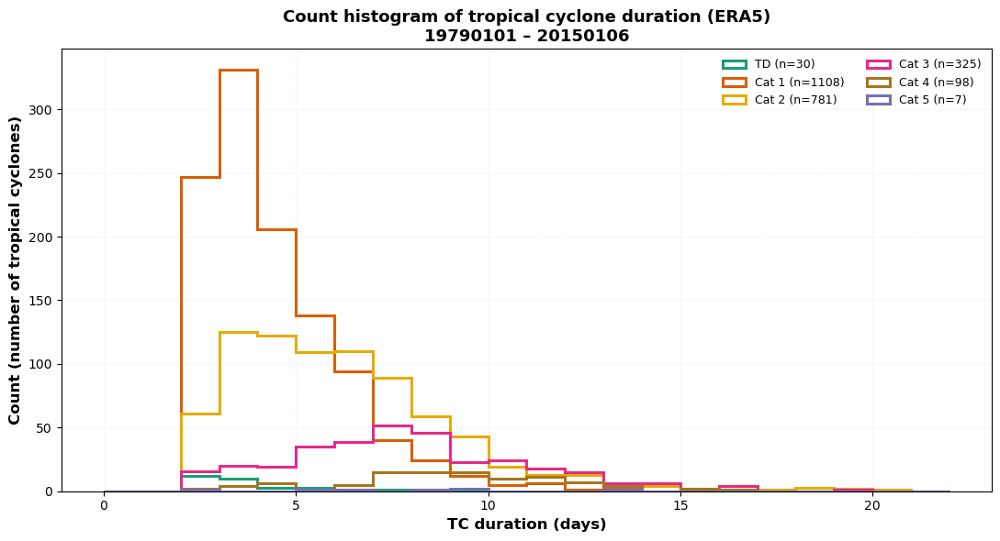

[OK] Figura salvata in: /work/users/mccorda/tc_analysis/Figures/tc_duration_count_histogram_outline_ERA5_19790101_20150106.pdf


In [31]:
# ===========================================
# ISTOGRAMMA DURATA TC - SOLO CONTORNI
# ===========================================
import numpy as np
import matplotlib.pyplot as plt
import os

# Categorie e colori (sobri, da paper)
cat_names = ['TD', 'Cat 1', 'Cat 2', 'Cat 3', 'Cat 4', 'Cat 5']
colors = ['#1b9e77', '#d95f02', '#e6ab02', '#e7298a', '#a6761d', '#7570b3']

# Bins di durata (giorni)
max_duration = max(
    max(v) for v in durations_by_cat.values() if len(v) > 0
)
bins = np.arange(0, int(np.ceil(max_duration)) + 2, 1)

# ==========================
# PLOT
# ==========================
fig, ax = plt.subplots(figsize=(11, 6))

for cat in range(6):
    data = durations_by_cat.get(cat, [])
    if len(data) == 0:
        continue
    
    ax.hist(
        data,
        bins=bins,
        histtype='step',
        linewidth=2.2,
        color=colors[cat],
        label=f'{cat_names[cat]} (n={len(data)})'
    )

# Labels e titolo
ax.set_xlabel('TC duration (days)', fontsize=12, fontweight='bold')
ax.set_ylabel('Count (number of tropical cyclones)', fontsize=12, fontweight='bold')

ax.set_title(
    f'Count histogram of tropical cyclone duration (ERA5)\n'
    f'{startdate} – {enddate}',
    fontsize=13,
    fontweight='bold'
)

# Griglia molto leggera
ax.grid(alpha=0.25, linestyle=':')

# Legenda compatta
ax.legend(fontsize=9, ncol=2, frameon=False)

plt.tight_layout()

# Salva
outfile = os.path.join(
    plotdir,
    f'tc_duration_count_histogram_outline_ERA5_{startdate}_{enddate}.pdf'
)
plt.savefig(outfile, dpi=300, bbox_inches='tight')
plt.show()

print(f"[OK] Figura salvata in: {outfile}")


Periodo analizzato: 1979-2014 (35 anni)

Frequenze annuali (storms/year):
  NH total: 40.5
  SH total: 23.4
    North Atlantic: 8.6
    East Pacific: 7.9
    West Pacific: 21.6
    North Indian: 2.3
    South Indian: 14.0
    South Pacific: 9.3


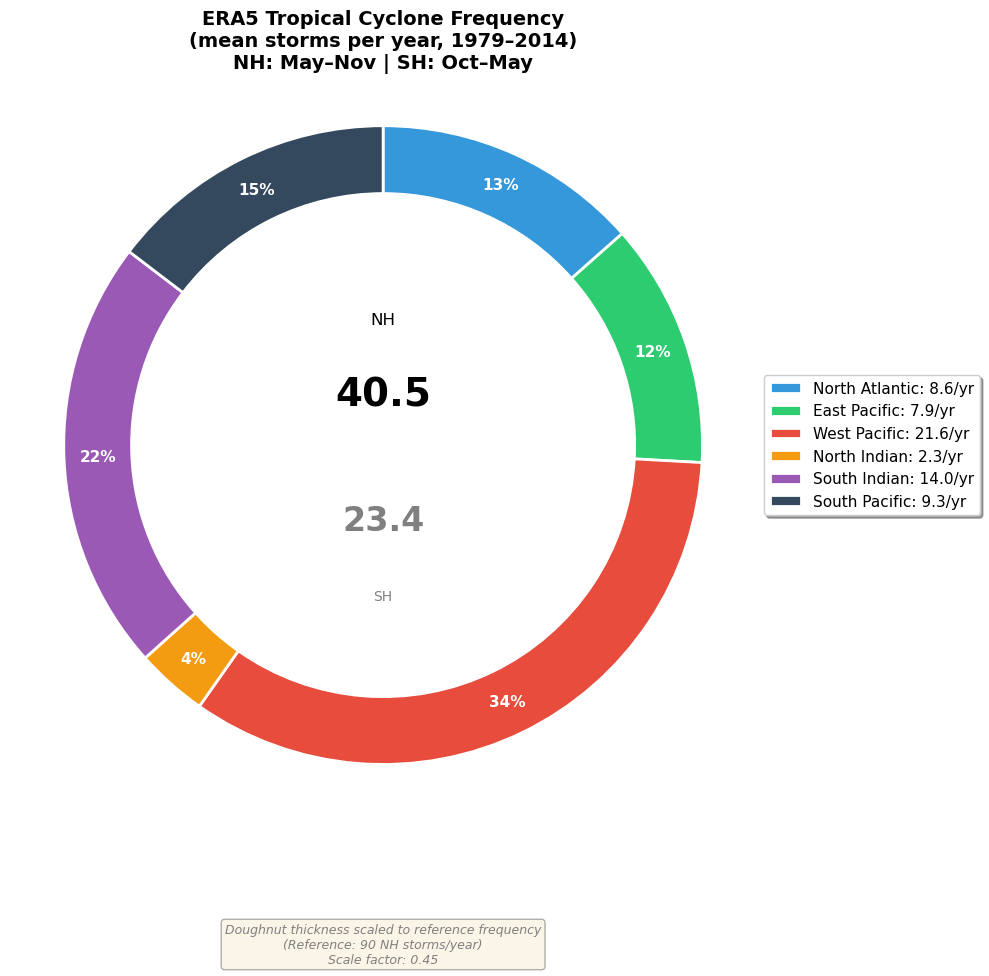


CONFRONTO CON ROBERTS ET AL. (2020) - ERA5
Bacino               Questo studio      Roberts et al.     Differenza     
----------------------------------------------------------------------
North Atlantic                    8.6             12.5     -3.9 (-31%)
East Pacific                      7.9             16.0     -8.1 (-51%)
West Pacific                     21.6             25.0     -3.4 (-13%)
North Indian                      2.3              5.5     -3.2 (-58%)
South Indian                     14.0             10.0      4.0 (+40%)
South Pacific                     9.3              4.5      4.8 (+108%)
----------------------------------------------------------------------
NH Total                         40.5             59.0    -18.5 (-31%)
SH Total                         23.4             14.5      8.9 (+61%)


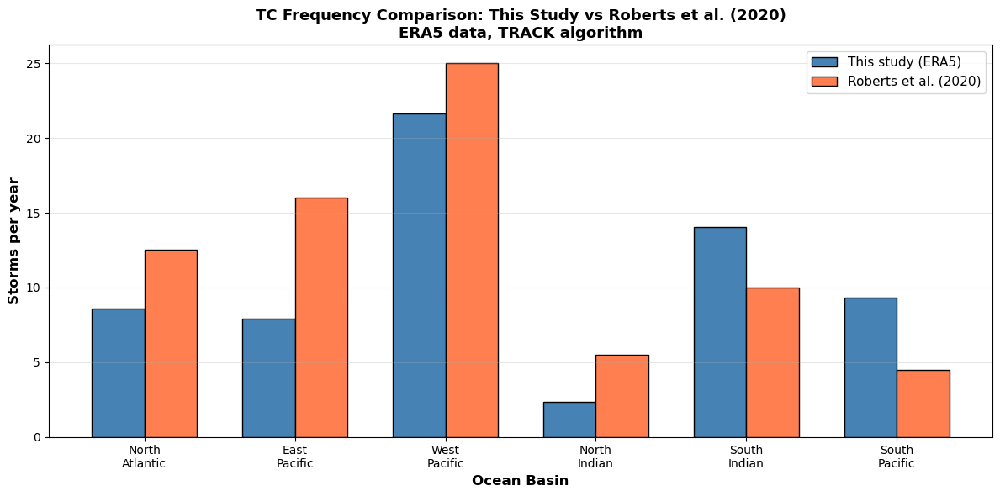

In [32]:
# ===========================================
# DOUGHNUT CHART - Stile Roberts et al. (2020)
# ===========================================
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Circle
import calendar



# Definisci stagioni cicloniche
nh_season_months = [5, 6, 7, 8, 9, 10, 11]  # May-November
sh_season_months = [10, 11, 12, 1, 2, 3, 4, 5]  # October-May

# Bacini NH
nh_basins = ['North Atlantic', 'East Pacific', 'West Pacific', 'North Indian']
# Bacini SH
sh_basins = ['South Indian', 'South Pacific']

# Conta storms unici per bacino (primo timestep)
basin_counts = {basin: set() for basin in nh_basins + sh_basins}
years_tracked = set()

with open(filtered_file, 'r') as f:
    tracked_storms = {}
    
    for line in f:
        if 'track_id' in line:
            continue
        
        parts = line.strip().split()
        if len(parts) != 12:
            continue
        
        storm_id = parts[0]
        year = int(parts[1])
        month = int(parts[2])
        lon = float(parts[7])
        lat = float(parts[8])
        
        years_tracked.add(year)
        
        # Primo timestep di ogni storm
        if storm_id not in tracked_storms:
            basin = get_basin_ibtracs(lon, lat)
            hemisphere = 'NH' if lat >= 0 else 'SH'
            
            # Filtra per stagione ciclonica appropriata
            is_nh_season = month in nh_season_months
            is_sh_season = month in sh_season_months
            
            if hemisphere == 'NH' and is_nh_season and basin in nh_basins:
                basin_counts[basin].add(storm_id)
                tracked_storms[storm_id] = basin
            elif hemisphere == 'SH' and is_sh_season and basin in sh_basins:
                basin_counts[basin].add(storm_id)
                tracked_storms[storm_id] = basin

# Calcola frequenze annuali (storms/year)
n_years = len(years_tracked)
print(f"Periodo analizzato: {min(years_tracked)}-{max(years_tracked)} ({n_years} anni)")

# Frequenza annuale per bacino
basin_freq = {basin: len(storms) / n_years for basin, storms in basin_counts.items()}

# Totali emisfero
nh_total = sum([basin_freq[b] for b in nh_basins])
sh_total = sum([basin_freq[b] for b in sh_basins])

print(f"\nFrequenze annuali (storms/year):")
print(f"  NH total: {nh_total:.1f}")
print(f"  SH total: {sh_total:.1f}")
for basin in nh_basins + sh_basins:
    print(f"    {basin}: {basin_freq[basin]:.1f}")

# ===========================================
# 2. CREA DOUGHNUT CHART
# ===========================================
fig, ax = plt.subplots(figsize=(10, 10))

# Colori per bacini (come Roberts et al.)
colors = {
    'North Atlantic': '#3498db',  # blu
    'East Pacific': '#2ecc71',    # verde
    'West Pacific': '#e74c3c',    # rosso
    'North Indian': '#f39c12',    # arancione
    'South Indian': '#9b59b6',    # viola
    'South Pacific': '#34495e'    # grigio scuro
}

# Ordine bacini (orario partendo da Nord Atlantico)
basins_ordered = ['North Atlantic', 'East Pacific', 'West Pacific', 
                  'North Indian', 'South Indian', 'South Pacific']

# Valori e colori per il doughnut
sizes = [basin_freq[b] for b in basins_ordered]
colors_list = [colors[b] for b in basins_ordered]

# Riferimento osservazionale (IBTrACS climatology ~90 storms/year NH)
# Questo è usato per scalare lo spessore
reference_freq = 90.0  # storms/year NH (dato letteratura)
scale_factor = nh_total / reference_freq

# Dimensioni doughnut
inner_radius = 0.5
outer_radius = 0.5 + (0.3 * scale_factor)  # Spessore scalato

#--------------------------
# ==========================
# Percentuali globali per bacino
# ==========================
global_total = sum(sizes)

basin_percentages = [
    100.0 * basin_freq[b] / global_total for b in basins_ordered
]
#----------------------------------------------

# Crea doughnut
wedges, texts = ax.pie(sizes, 
                       colors=colors_list,
                       startangle=90,
                       counterclock=False,
                       radius=outer_radius,
                       wedgeprops=dict(width=outer_radius-inner_radius, 
                                      edgecolor='white', 
                                      linewidth=2))


#-----------------
# ==========================
# Aggiungi percentuali sui settori (stile Roberts et al. 2020)
# ==========================
for wedge, pct in zip(wedges, basin_percentages):

    # Evita settori troppo piccoli
    if pct < 3.0:
        continue

    # Angolo medio del settore
    angle = 0.5 * (wedge.theta1 + wedge.theta2)
    angle_rad = np.deg2rad(angle)

    # Posizione del testo (a metà dello spessore del doughnut)
    r_text = inner_radius + 0.5 * (outer_radius - inner_radius)
    x = r_text * np.cos(angle_rad)
    y = r_text * np.sin(angle_rad)

    ax.text(
        x, y,
        f'{pct:.0f}%',
        ha='center',
        va='center',
        fontsize=11,
        fontweight='bold',
        color='white',
        zorder=12
    )
#-----------------------------------------
# Aggiungi cerchio interno bianco
circle = Circle((0, 0), inner_radius, color='white', zorder=10)
ax.add_artist(circle)

# Testo centrale con totali
ax.text(0, 0.1, f'{nh_total:.1f}', 
       ha='center', va='center', fontsize=28, fontweight='bold',
       color='black', zorder=11)
ax.text(0, -0.15, f'{sh_total:.1f}', 
       ha='center', va='center', fontsize=24, fontweight='bold',
       color='gray', zorder=11)

ax.text(0, 0.25, 'NH', 
       ha='center', va='center', fontsize=12, 
       color='black', zorder=11)
ax.text(0, -0.3, 'SH', 
       ha='center', va='center', fontsize=10, 
       color='gray', zorder=11)

# Titolo
ax.set_title(f'ERA5 Tropical Cyclone Frequency\n'
             f'(mean storms per year, {min(years_tracked)}–{max(years_tracked)})\n'
             f'NH: May–Nov | SH: Oct–May',
             fontsize=14, fontweight='bold', pad=20)

# Legenda con numeri
legend_labels = [f'{basin}: {basin_freq[basin]:.1f}/yr' 
                for basin in basins_ordered]
ax.legend(wedges, legend_labels, 
         loc='center left', bbox_to_anchor=(1, 0, 0.5, 1),
         fontsize=11, frameon=True, fancybox=True, shadow=True)

# Note
note_text = (f"Doughnut thickness scaled to reference frequency\n"
             f"(Reference: {reference_freq:.0f} NH storms/year)\n"
             f"Scale factor: {scale_factor:.2f}")

ax.text(0, -0.95, note_text, 
       ha='center', va='top', fontsize=9, 
       style='italic', color='gray',
       bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.3))

ax.axis('equal')

plt.tight_layout()
plt.savefig(os.path.join(plotdir,
            f'tc_doughnut_frequency_{config["dataset"]["model"]}_{config["dataset"]["exp"]}_{startdate}_{enddate}.pdf'),
            dpi=300, bbox_inches='tight')
plt.show()

# ===========================================
# 3. CONFRONTO CON ROBERTS ET AL. (2020)
# ===========================================
# Valori approssimativi da Roberts et al. per confronto
roberts_era5 = {
    'North Atlantic': 12.5,
    'East Pacific': 16.0,
    'West Pacific': 25.0,
    'North Indian': 5.5,
    'South Indian': 10.0,
    'South Pacific': 4.5,
    'NH_total': 59.0,
    'SH_total': 14.5
}

print("\n" + "="*70)
print("CONFRONTO CON ROBERTS ET AL. (2020) - ERA5")
print("="*70)
print(f"{'Bacino':<20} {'Questo studio':<18} {'Roberts et al.':<18} {'Differenza':<15}")
print("-"*70)

for basin in basins_ordered:
    our_val = basin_freq[basin]
    roberts_val = roberts_era5.get(basin, np.nan)
    diff = our_val - roberts_val
    diff_pct = (diff / roberts_val * 100) if roberts_val > 0 else 0
    
    print(f"{basin:<20} {our_val:>16.1f} {roberts_val:>16.1f} {diff:>8.1f} ({diff_pct:+.0f}%)")

print("-"*70)
print(f"{'NH Total':<20} {nh_total:>16.1f} {roberts_era5['NH_total']:>16.1f} "
      f"{nh_total - roberts_era5['NH_total']:>8.1f} "
      f"({(nh_total - roberts_era5['NH_total'])/roberts_era5['NH_total']*100:+.0f}%)")
print(f"{'SH Total':<20} {sh_total:>16.1f} {roberts_era5['SH_total']:>16.1f} "
      f"{sh_total - roberts_era5['SH_total']:>8.1f} "
      f"({(sh_total - roberts_era5['SH_total'])/roberts_era5['SH_total']*100:+.0f}%)")

# ===========================================
# 4. PLOT CONFRONTO (bar chart)
# ===========================================
fig, ax = plt.subplots(figsize=(12, 6))

x = np.arange(len(basins_ordered))
width = 0.35

bars1 = ax.bar(x - width/2, [basin_freq[b] for b in basins_ordered], width,
              label='This study (ERA5)', color='steelblue', edgecolor='black')
bars2 = ax.bar(x + width/2, [roberts_era5[b] for b in basins_ordered], width,
              label='Roberts et al. (2020)', color='coral', edgecolor='black')

ax.set_xlabel('Ocean Basin', fontsize=12, fontweight='bold')
ax.set_ylabel('Storms per year', fontsize=12, fontweight='bold')
ax.set_title(f'TC Frequency Comparison: This Study vs Roberts et al. (2020)\n'
             f'ERA5 data, TRACK algorithm',
             fontsize=13, fontweight='bold')
ax.set_xticks(x)
ax.set_xticklabels([b.replace(' ', '\n') for b in basins_ordered], fontsize=10)
ax.legend(fontsize=11)
ax.grid(alpha=0.3, axis='y')



plt.tight_layout()
plt.savefig(os.path.join(plotdir,
            f'tc_frequency_comparison_{config["dataset"]["model"]}_{config["dataset"]["exp"]}_{startdate}_{enddate}.pdf'),
            dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
client.shutdown()
cluster.close()